In [140]:
# Libaries import
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from copy import copy

In [141]:
import pandas as pd
from copy import copy

# Read the CSV file
data = pd.read_csv(r"C:\Users\maxno\iCloudDrive\Data-analytics\BABD 2023 - 2024\Core Course\Machine Learning & Business Applications\model.csv")

# Display the first few rows of the DataFrame
print(data.head(n=4))

# Make a copy of the original data
original_data = copy(data)

# Display the columns of the DataFrame
print(data.columns)

   age_days   n_tokens_title   n_tokens_review   n_unique_tokens  \
0       436                9               532          0.462264   
1       185               16              1012          0.446247   
2       210               12               506          0.546559   
3       723               11               241          0.543933   

    n_non_stop_words   n_non_stop_unique_tokens   num_hrefs   num_self_hrefs  \
0                1.0                   0.594427           7                7   
1                1.0                   0.638112           4                2   
2                1.0                   0.693291           8                3   
3                1.0                   0.648649           5                4   

    num_imgs   num_videos  ...   min_positive_polarity  \
0          1            0  ...                0.136364   
1          3           11  ...                0.100000   
2          2            1  ...                0.050000   
3          1            1 

In [142]:
share_data = data[' shares']
data[' shares'].describe()

count     28000.000000
mean       3408.232750
std       12578.941208
min           5.000000
25%         942.000000
50%        1400.000000
75%        2700.000000
max      843300.000000
Name:  shares, dtype: float64

In [127]:
data.describe()

,age_days,n_tokens_title,n_tokens_review,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
count,28000.000000,28000.000000,28000.000000,28000.000000,2.800000e+04,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,...,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000
mean,360.376286,10.379679,559.612036,0.547309,1.000000e+00,0.693451,11.229857,3.382214,4.558214,1.261143,...,0.098734,0.779888,-0.267296,-0.536794,-0.110911,0.280761,0.070664,0.342251,0.155292,3408.232750
std,212.558887,2.106580,464.024465,0.102457,4.052939e-09,0.101096,11.424556,3.812180,8.275950,4.214034,...,0.070214,0.212355,0.121056,0.279475,0.094832,0.323489,0.264927,0.188608,0.225972,12578.941208
min,8.000000,2.000000,18.000000,0.123422,9.999999e-01,0.119134,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,5.000000
25%,175.000000,9.000000,258.000000,0.477454,1.000000e+00,0.632627,5.000000,1.000000,1.000000,0.000000,...,0.050000,0.600000,-0.331566,-0.714286,-0.125000,0.000000,0.000000,0.166667,0.000000,942.000000
50%,348.000000,10.000000,420.000000,0.543549,1.000000e+00,0.693603,8.000000,3.000000,1.000000,0.000000,...,0.100000,0.800000,-0.257407,-0.500000,-0.100000,0.125000,0.000000,0.500000,0.000000,1400.000000
75%,547.000000,12.000000,728.000000,0.611805,1.000000e+00,0.757404,14.000000,4.000000,4.000000,1.000000,...,0.100000,1.000000,-0.193333,-0.312500,-0.050000,0.500000,0.136364,0.500000,0.250000,2700.000000
max,731.000000,20.000000,8474.000000,1.000000,1.000000e+00,1.000000,304.000000,74.000000,128.000000,91.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.500000,1.000000,843300.000000


In [143]:
# Define cutoff points based on percentiles
cutoff_very_poor = data[' shares'].quantile(0.35)
cutoff_poor = data[' shares'].quantile(0.5)  # Top 35% - 50%
cutoff_average = data[' shares'].quantile(0.6)  # Top 50% - 60%
cutoff_good = data[' shares'].quantile(0.8)  # Top 60% - 80%
cutoff_very_good = data[' shares'].quantile(0.9)  # Top 80% - 90%
cutoff_excellent = data[' shares'].quantile(0.95)  # Top 90% - 95%

# Create label grades for the classes
share_label = []
for share in share_data:
    if share <= cutoff_very_poor:
        share_label.append('Very Poor')
    elif share <= cutoff_poor:
        share_label.append('Poor')
    elif share <= cutoff_average:
        share_label.append('Average')
    elif share <= cutoff_good:
        share_label.append('Good')
    elif share <= cutoff_very_good:
        share_label.append('Very Good')
    elif share <= cutoff_excellent:
        share_label.append('Excellent')
    else:
        share_label.append('Exceptional')

# Update this class label into the dataframe
data = pd.concat([data, pd.DataFrame(share_label, columns=['popularity'])], axis=1)
data.head(4)

,age_days,n_tokens_title,n_tokens_review,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,popularity
0,436,9,532,0.462264,1.0,0.594427,7,7,1,0,...,1.0,-0.180556,-0.25,-0.125,0.50,0.500,0.00,0.500,2200,Good
1,185,16,1012,0.446247,1.0,0.638112,4,2,3,11,...,0.9,-0.318981,-1.00,-0.050,0.05,-0.075,0.45,0.075,816,Very Poor
2,210,12,506,0.546559,1.0,0.693291,8,3,2,1,...,0.5,-0.292708,-0.75,-0.100,0.00,0.000,0.50,0.000,1000,Very Poor
3,723,11,241,0.543933,1.0,0.648649,5,4,1,1,...,0.7,0.000000,0.00,0.000,0.00,0.000,0.50,0.000,660,Very Poor


In [144]:
data.columns

Index(['age_days', ' n_tokens_title', ' n_tokens_review', ' n_unique_tokens',
       ' n_non_stop_words', ' n_non_stop_unique_tokens', ' num_hrefs',
       ' num_self_hrefs', ' num_imgs', ' num_videos', ' average_token_length',
       ' num_keywords', 'product_category', ' kw_min_min', ' kw_max_min',
       ' kw_avg_min', ' kw_min_max', ' kw_max_max', ' kw_avg_max',
       ' kw_min_avg', ' kw_max_avg', ' kw_avg_avg',
       ' self_reference_min_shares', ' self_reference_max_shares',
       ' self_reference_avg_sharess', 'day', 'topic_quality', 'topic_shipping',
       'topic_packaging', 'topic_description', 'topic_others',
       ' global_subjectivity', ' global_sentiment_polarity',
       ' global_rate_positive_words', ' global_rate_negative_words',
       ' rate_positive_words', ' rate_negative_words',
       ' avg_positive_polarity', ' min_positive_polarity',
       ' max_positive_polarity', ' avg_negative_polarity',
       ' min_negative_polarity', ' max_negative_polarity',
       

In [145]:
print(data)

       age_days   n_tokens_title   n_tokens_review   n_unique_tokens  \
0           436                9               532          0.462264   
1           185               16              1012          0.446247   
2           210               12               506          0.546559   
3           723               11               241          0.543933   
4           345               11               983          0.405930   
...         ...              ...               ...               ...   
27995       694                9               214          0.455399   
27996       428                8               206          0.647059   
27997        93               11              1083          0.535104   
27998        90               12               817          0.452229   
27999       681               13              1239          0.382686   

        n_non_stop_words   n_non_stop_unique_tokens   num_hrefs  \
0                    1.0                   0.594427           7   
1

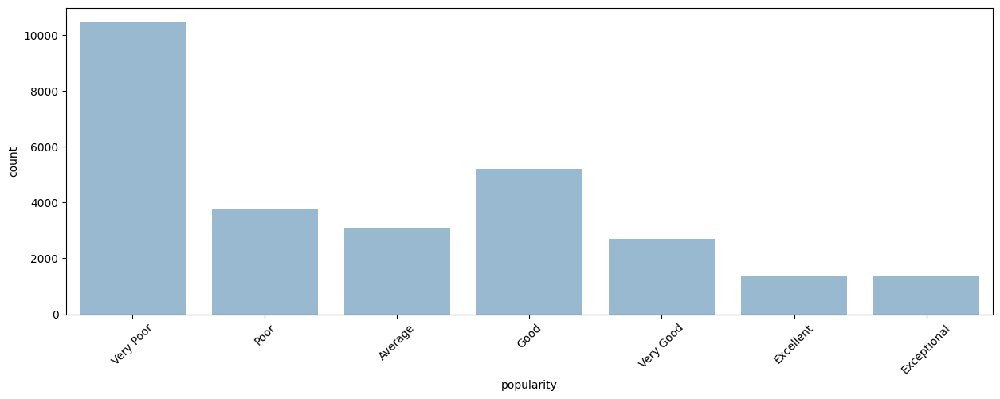

In [146]:
# Define the order of the categories
popularity_order = ['Very Poor', 'Poor', 'Average', 'Good', 'Very Good', 'Excellent', 'Exceptional']

# Create the countplot with the specified order
fig = plt.figure(figsize=(15, 5))
ax = sns.countplot(x='popularity', data=data, alpha=0.5, order=popularity_order)

# Optionally, you can rotate the x-labels for better visibility
plt.xticks(rotation=45)

plt.show()

In [147]:
# Fetch the counts for each class
class_counts = data.groupby('popularity').size().reset_index()
class_counts.columns = ['Popularity','No of articles']
class_counts

,Popularity,No of articles
0,Average,3101
1,Excellent,1385
2,Exceptional,1388
3,Good,5219
4,Poor,3757
5,Very Good,2697
6,Very Poor,10453


# Data Visualization

In [148]:
# Visualizing the "low" expectation hypothesis
# n_non_stop_words
print(data[' n_non_stop_words'].describe())

count    2.800000e+04
mean     1.000000e+00
std      4.052939e-09
min      9.999999e-01
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      1.000000e+00
Name:  n_non_stop_words, dtype: float64


In [149]:
print(data.shape)

(28000, 49)


In [151]:
print(data.columns)

Index(['age_days', ' n_tokens_title', ' n_tokens_review', ' n_unique_tokens',
       ' n_non_stop_words', ' n_non_stop_unique_tokens', ' num_hrefs',
       ' num_self_hrefs', ' num_imgs', ' num_videos', ' average_token_length',
       ' num_keywords', 'product_category', ' kw_min_min', ' kw_max_min',
       ' kw_avg_min', ' kw_min_max', ' kw_max_max', ' kw_avg_max',
       ' kw_min_avg', ' kw_max_avg', ' kw_avg_avg',
       ' self_reference_min_shares', ' self_reference_max_shares',
       ' self_reference_avg_sharess', 'day', 'topic_quality', 'topic_shipping',
       'topic_packaging', 'topic_description', 'topic_others',
       ' global_subjectivity', ' global_sentiment_polarity',
       ' global_rate_positive_words', ' global_rate_negative_words',
       ' rate_positive_words', ' rate_negative_words',
       ' avg_positive_polarity', ' min_positive_polarity',
       ' max_positive_polarity', ' avg_negative_polarity',
       ' min_negative_polarity', ' max_negative_polarity',
       

In [152]:
# remove noise from n_tokens_content. those equals to 0
data  = data[data[' n_tokens_review'] != 0]
print ("After noise removal - ",data.shape)

After noise removal -  (28000, 49)


<Axes: xlabel='popularity', ylabel=' n_non_stop_unique_tokens'>

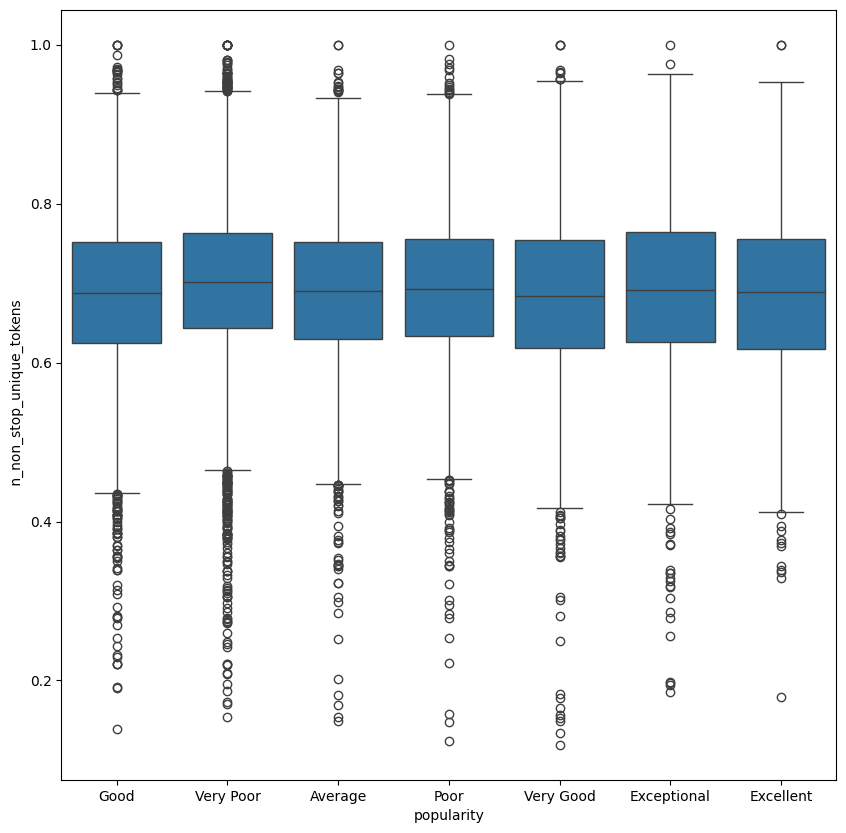

In [153]:
# n_non_stop_unique_tokens
data[' n_non_stop_unique_tokens'].describe()
# a lot of unique words, it is better to use a different plot from bar plots
# line plot
temp_data = data[data[' shares'] <= 100000]
fig, axes = plt.subplots(figsize=(10,10))
# box plot
sns.boxplot(x='popularity', y=' n_non_stop_unique_tokens', data=data, ax=axes)
# box plot of the dataset shows majority (75%) of the data inrespective of their shares is in the range of 0.6 - 0.8.

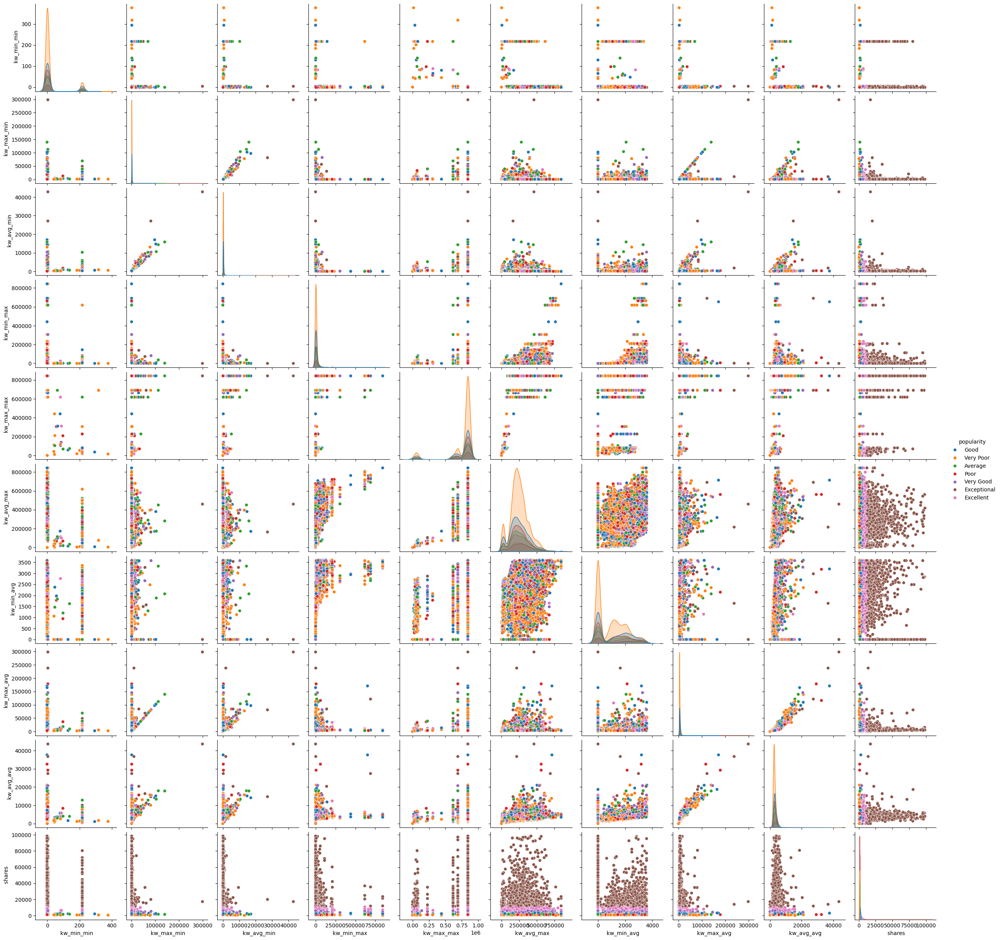

In [154]:
#kw_min_min and related kw_ terms
data[' kw_min_min'].describe()
temp_data = data[data[' shares'] <= 100000]
# running a pair plot for the kw__terms
kw_cols = [' kw_min_min', ' kw_max_min', ' kw_avg_min', ' kw_min_max', ' kw_max_max', ' kw_avg_max', ' kw_min_avg',
            ' kw_max_avg', ' kw_avg_avg', ' shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

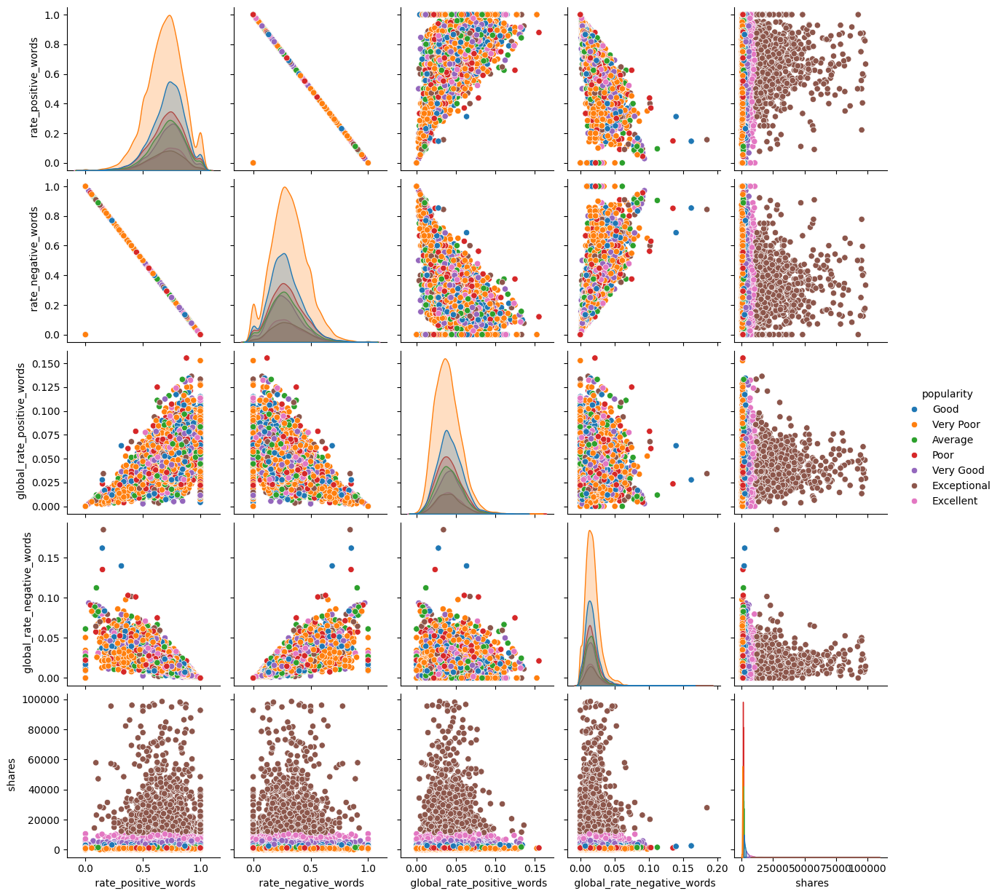

In [155]:
#Finding relationship between 'rate_positive_words', 'rate_negative_words', 'global_rate_positive_words', 'global_rate_negative_words', and 'shares'
temp_data = data[data[' shares'] <= 100000]
# running a pair plot for the these terms
kw_cols = [' rate_positive_words', ' rate_negative_words', ' global_rate_positive_words', ' global_rate_negative_words', ' shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

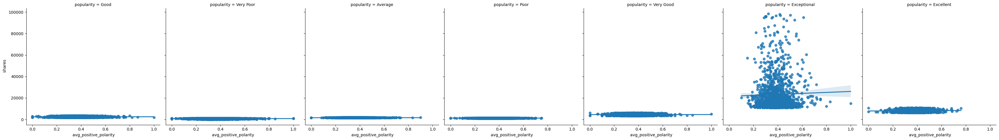

In [156]:
# attempt polartiy
temp_data = data[data[' shares'] <= 100000]
sns.lmplot(x=' avg_positive_polarity', y=' shares', col='popularity', data=temp_data)

<Axes: xlabel=' avg_positive_polarity', ylabel=' shares'>

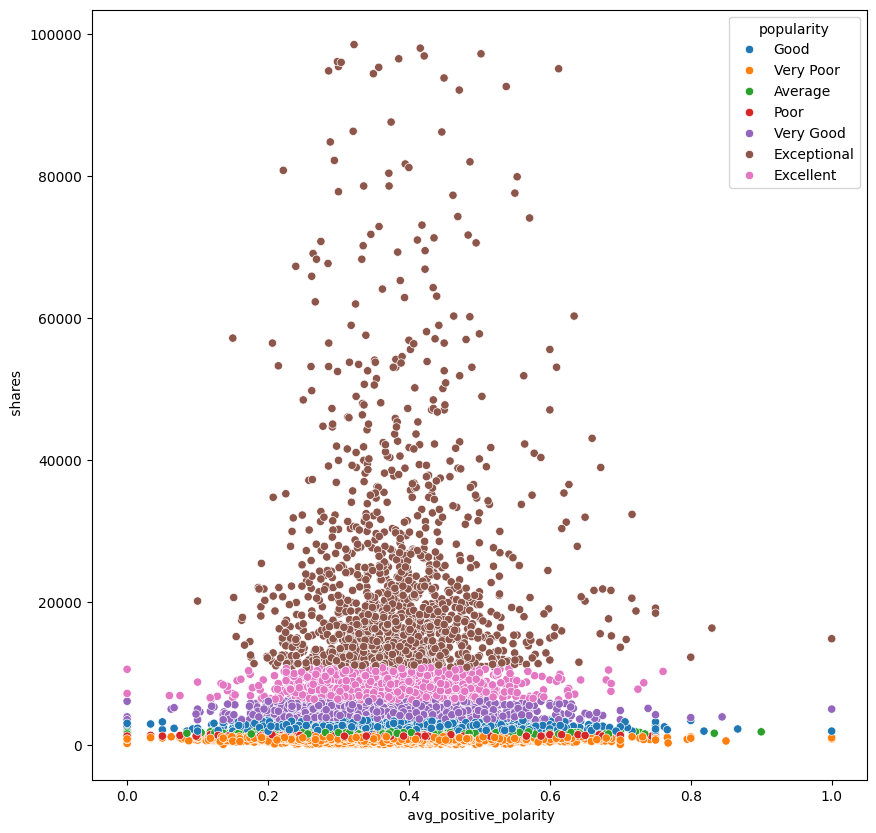

In [157]:
# attempt polartiy
temp_data = data[data[' shares'] <= 100000]
fig, axes = plt.subplots(figsize=(10,10))
sns.scatterplot(x=' avg_positive_polarity', y=' shares', hue='popularity', data=temp_data, ax=axes)

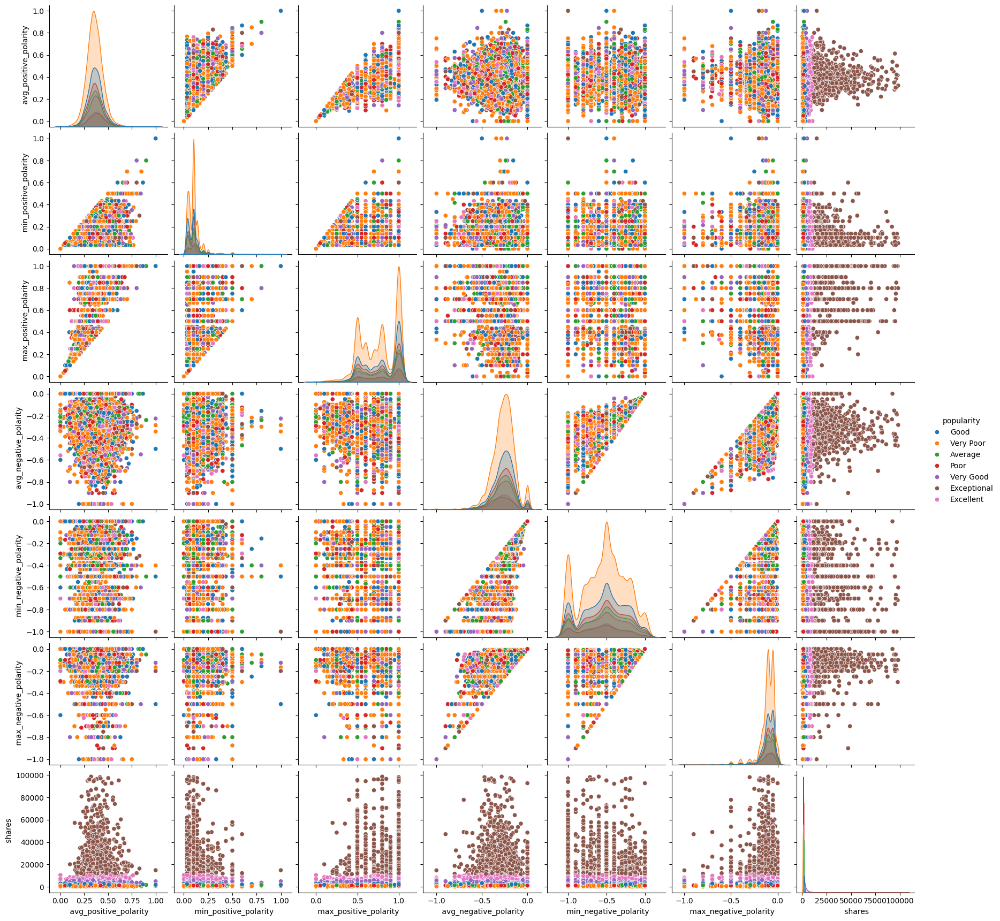

In [158]:
#Finding relationship between 'rate_positive_words', 'rate_negative_words', 'global_rate_positive_words', 'global_rate_negative_words', and 'shares'
temp_data = data[data[' shares'] <= 100000]
# running a pair plot for the terms
kw_cols = [' avg_positive_polarity', ' min_positive_polarity', ' max_positive_polarity', ' avg_negative_polarity', ' min_negative_polarity', ' max_negative_polarity', ' shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

<Axes: xlabel=' title_sentiment_polarity', ylabel=' shares'>

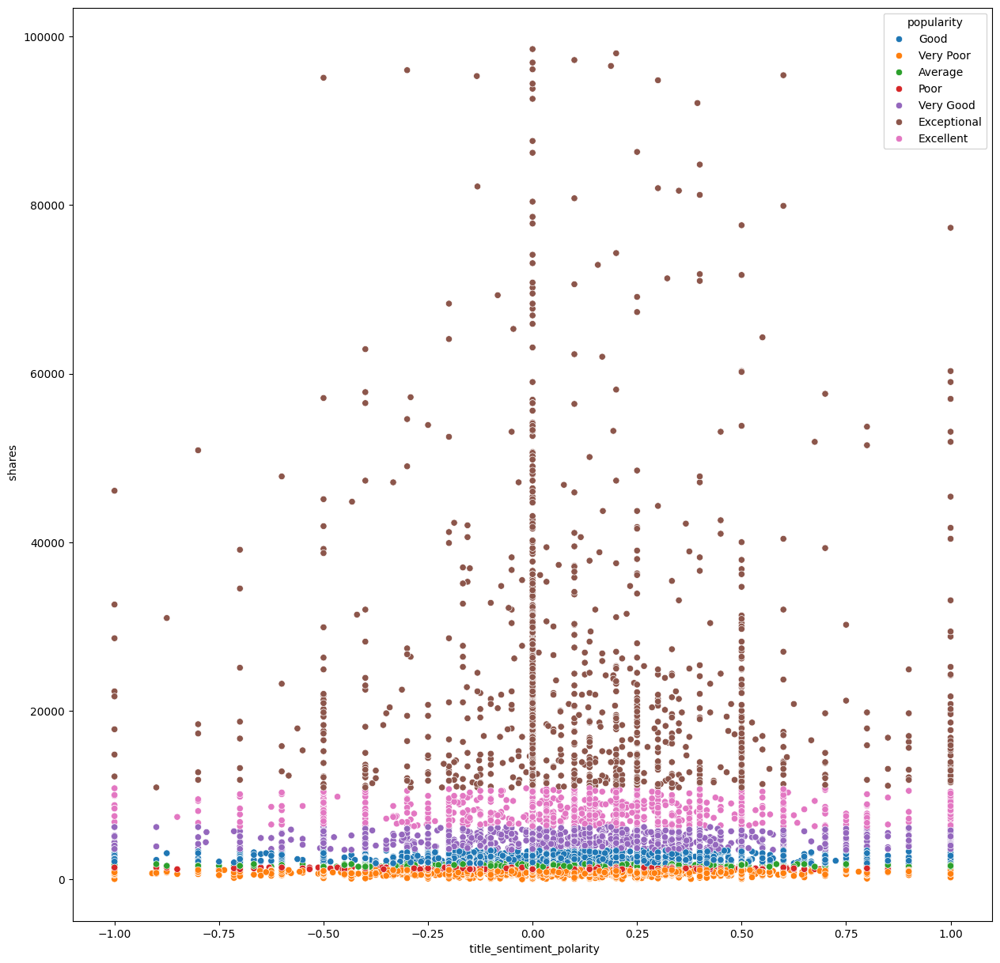

In [159]:
# attempt title_subjectivity
temp_data = data[data[' shares'] <= 100000]
fig, axes = plt.subplots(figsize=(15,15))
sns.scatterplot(x=' title_sentiment_polarity', y=' shares', hue='popularity', data=temp_data, ax=axes)

c:\Users\maxno\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\relational.py:733: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


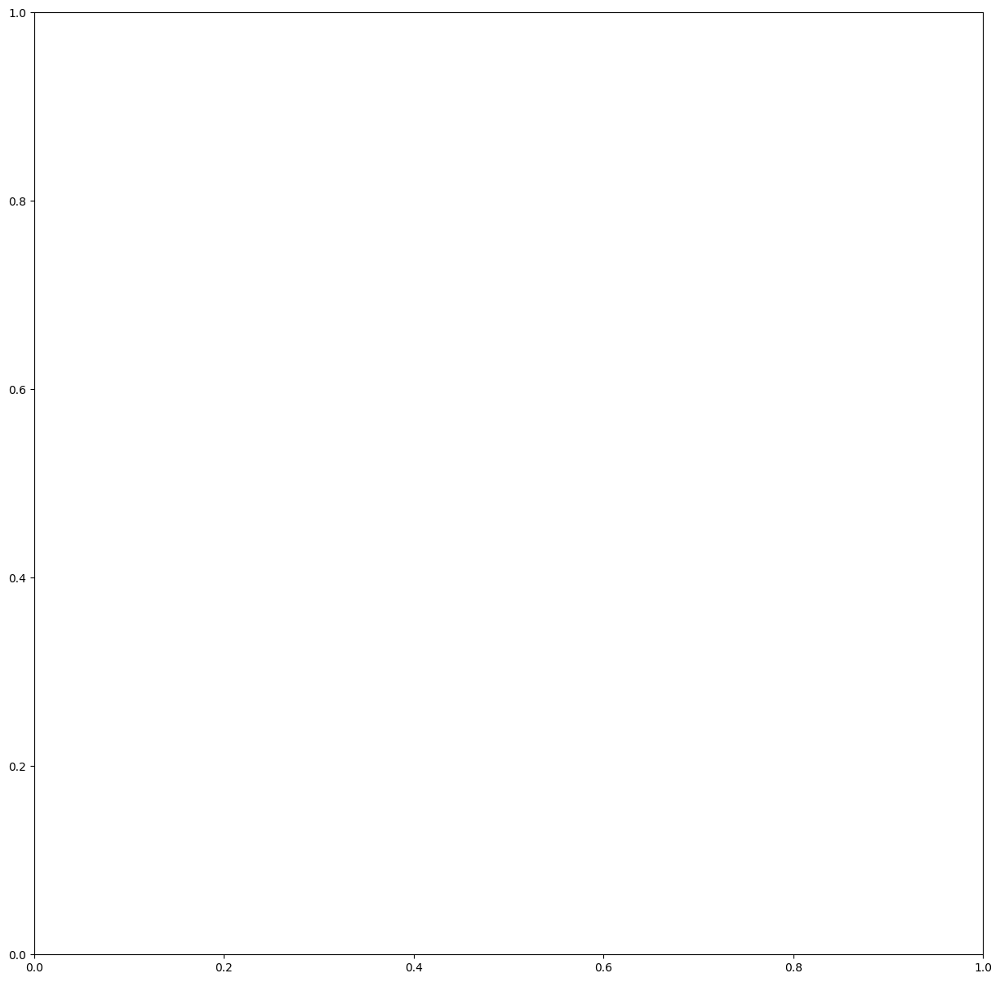

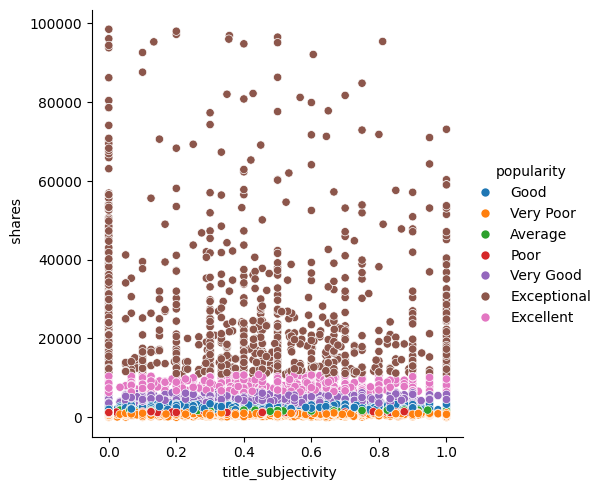

In [160]:
# attempt title_subjectivity
temp_data = data[data[' shares'] <= 100000]
fig, axes = plt.subplots(figsize=(15,15))
sns.relplot(x=' title_subjectivity', y=' shares', hue='popularity', data=temp_data, ax=axes)

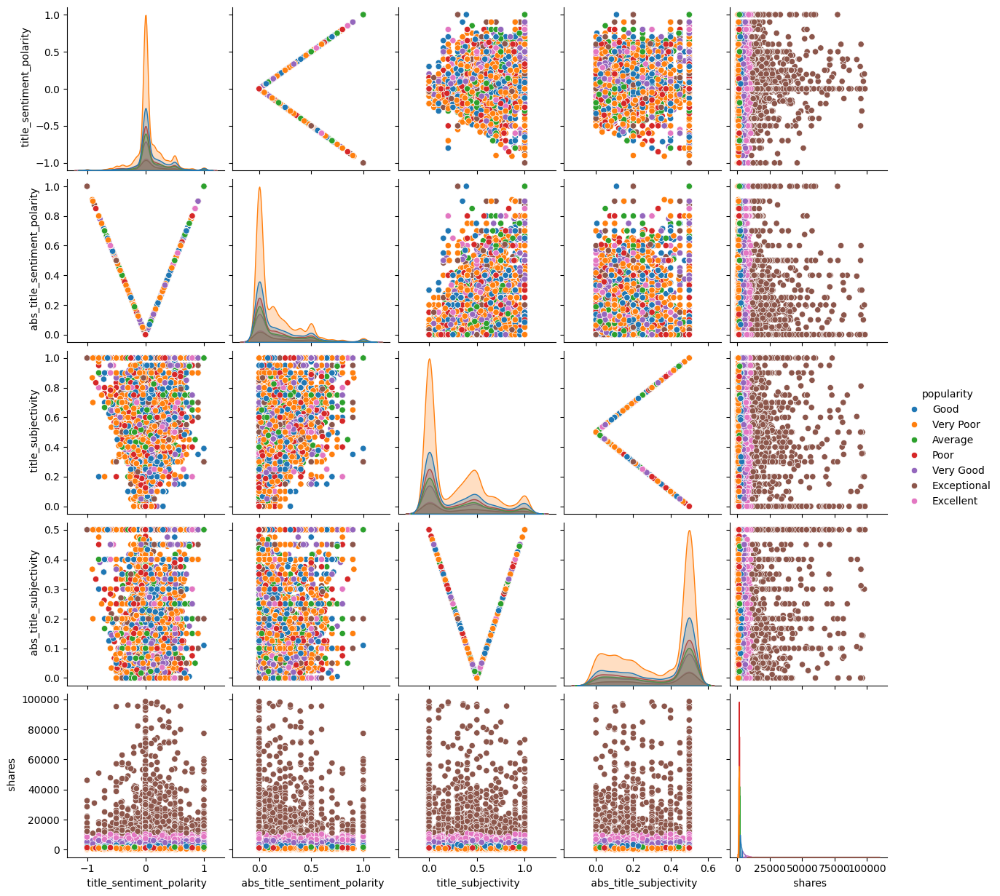

In [161]:
temp_data = data[data[' shares'] <= 100000]
# running a pair plot for the kw__terms
kw_cols = [' title_sentiment_polarity', ' abs_title_sentiment_polarity', ' title_subjectivity', ' abs_title_subjectivity', ' shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

<Axes: xlabel=' self_reference_min_shares', ylabel=' shares'>

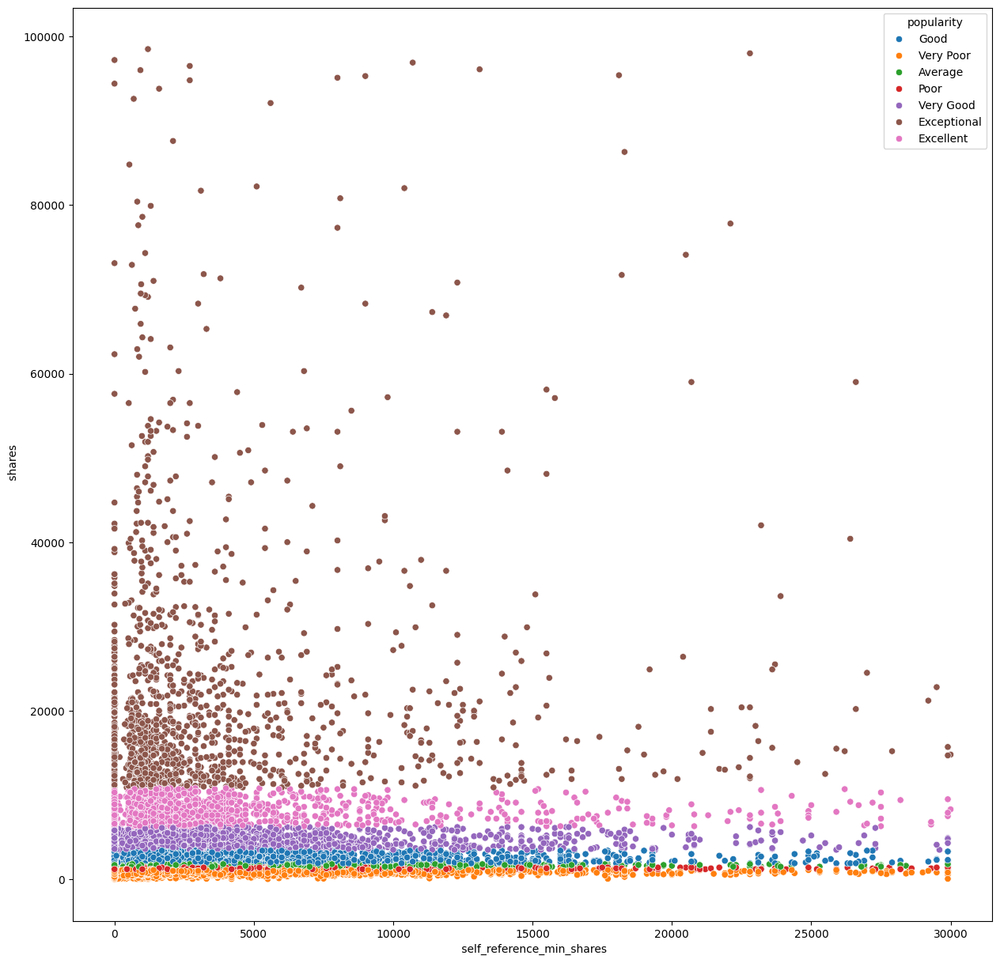

In [162]:
# attempt self_reference_min_shares
temp_data = data[(data[' shares'] <= 100000) & (data[' self_reference_min_shares'] <= 30000)]
fig, axes = plt.subplots(figsize=(15,15))
sns.scatterplot(x=' self_reference_min_shares', y=' shares', hue= 'popularity', data=temp_data, ax=axes)

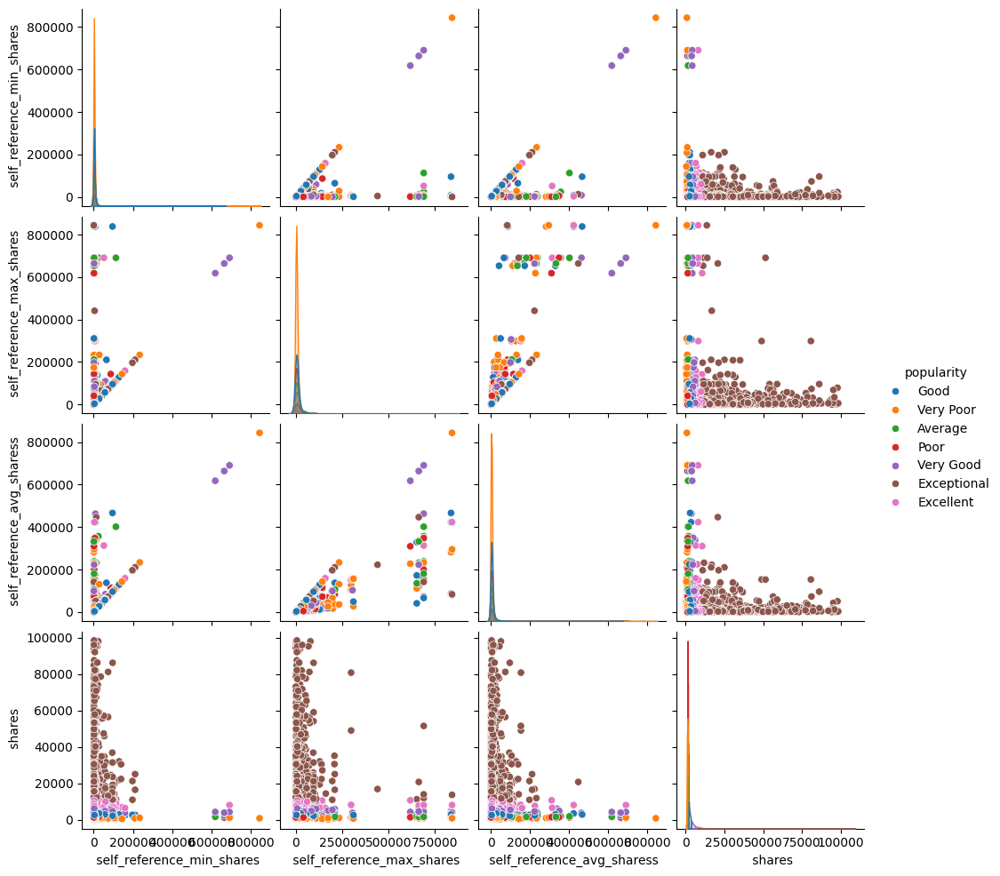

In [163]:
temp_data = data[data[' shares'] <= 100000]
# running a pair plot for the kw__terms
kw_cols = [' self_reference_min_shares', ' self_reference_max_shares', ' self_reference_avg_sharess', ' shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

In [164]:
# extract the weekdays articles distrubution
weekdays_data = data.groupby('day').size().reset_index()
weekdays_data.columns = ['day','count']
weekdays_data

,day,count
0,friday,3999
1,monday,4768
2,saturday,1724
3,sunday,1902
4,thursday,5127
5,tuesday,5184
6,wednesday,5296


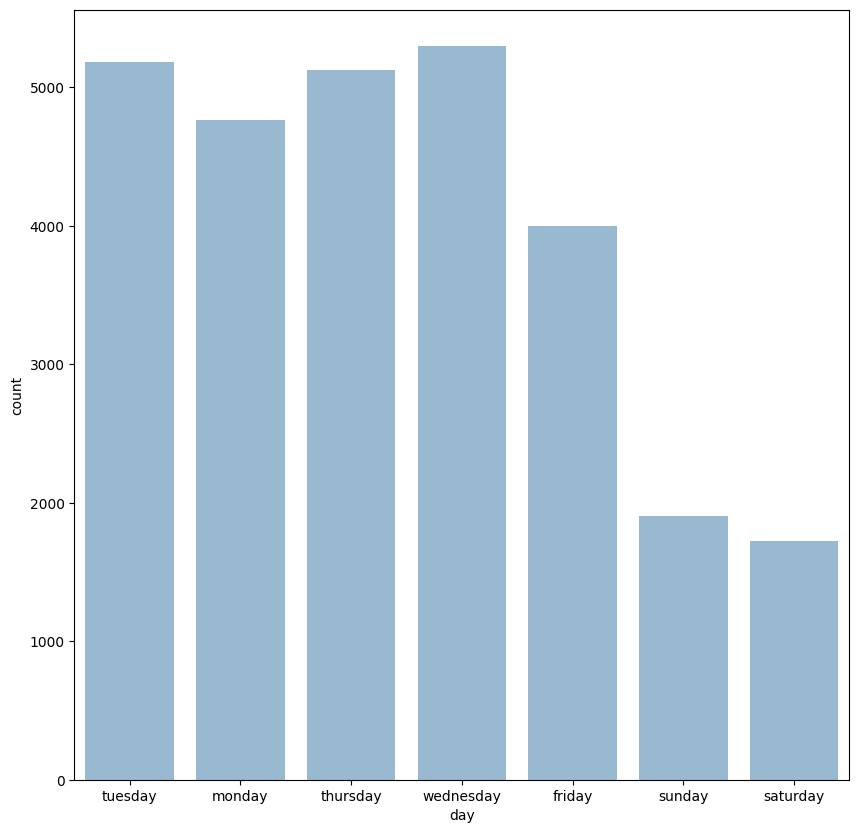

In [165]:
# shows the days when articles are usually posted
fig, axes = plt.subplots(figsize=(10,10))
ax = sns.countplot(x='day',data=data,alpha=0.5, ax=axes)

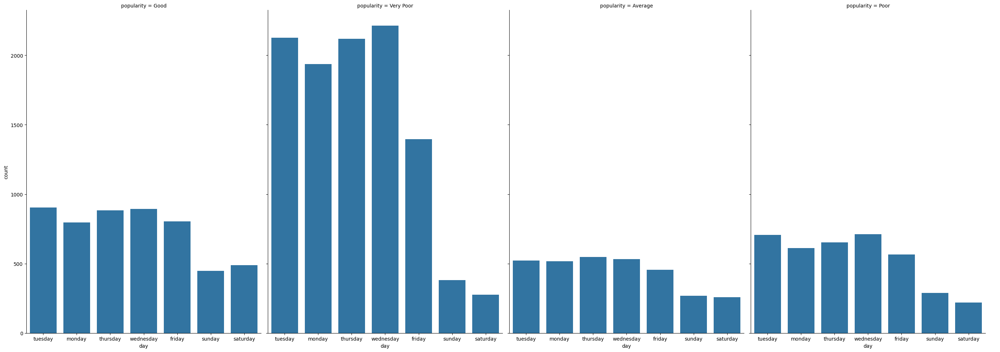

In [166]:
# shows relationship with the number of shares and the weekdays
temp_data = data[(data['popularity'] == 'Very Poor') | (data['popularity'] == 'Poor') | (data['popularity'] == 'Average') | (data['popularity'] == 'Good')]
ax = sns.catplot(x='day', col="popularity", data=temp_data, kind="count", height=10, aspect=.7)

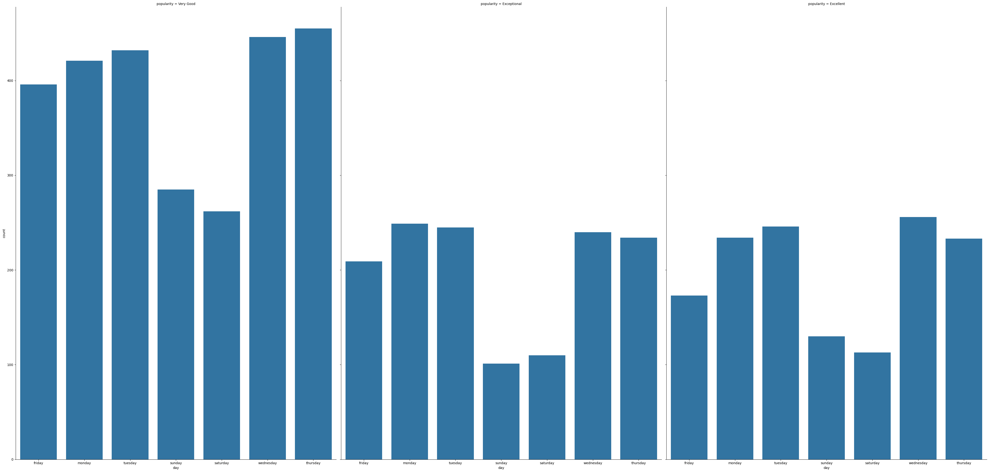

In [167]:
# shows relationship with the number of shares and the weekdays (compare only the best three popularity)
temp_data = data[(data['popularity'] == 'Exceptional') | (data['popularity'] == 'Excellent') | (data['popularity'] == 'Very Good')]
ax = sns.catplot(x='day', col="popularity", data=temp_data, kind="count", height=20, aspect=.7)

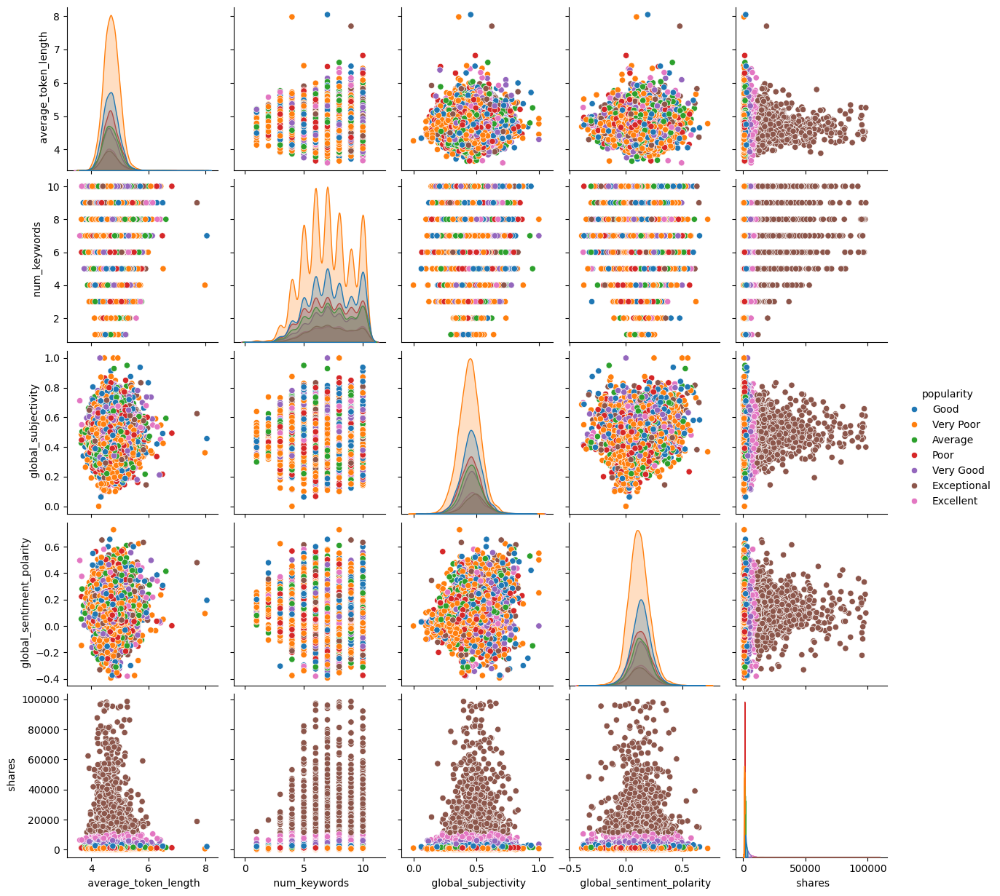

In [168]:
temp_data = data[data[' shares'] <= 100000]
# running a pair plot for the kw__terms
kw_cols = [' average_token_length', ' num_keywords', ' global_subjectivity', ' global_sentiment_polarity', ' shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

In [169]:
## Seeing the distribution of the articles across the data channels
# extact the weekdays articles distrubution
data_channel_data = data.groupby('product_category').size().reset_index()
data_channel_data.columns = ['Product Category','No of reviews']
data_channel_data

,Product Category,No of reviews
0,business,4566
1,cleaning,1519
2,entertainment,5006
3,other,4033
4,sport,1672
5,tech,5320
6,travel,5884


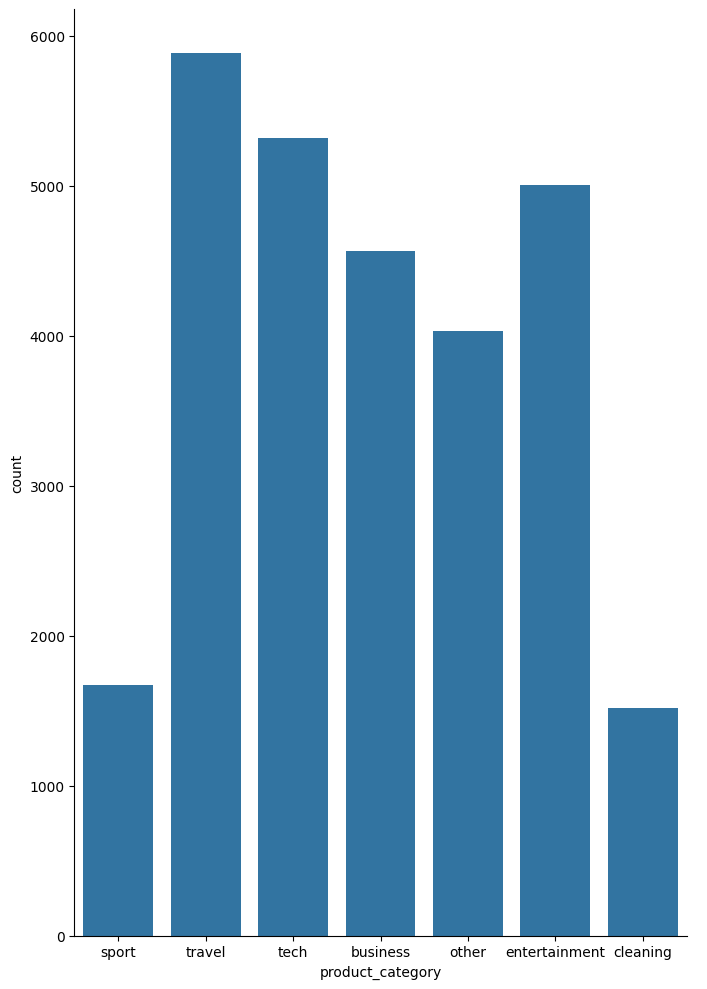

In [170]:
# Shows the distribution of the articles across the channels
sns.catplot(x='product_category', data=data, kind="count", height=10, aspect=.7)

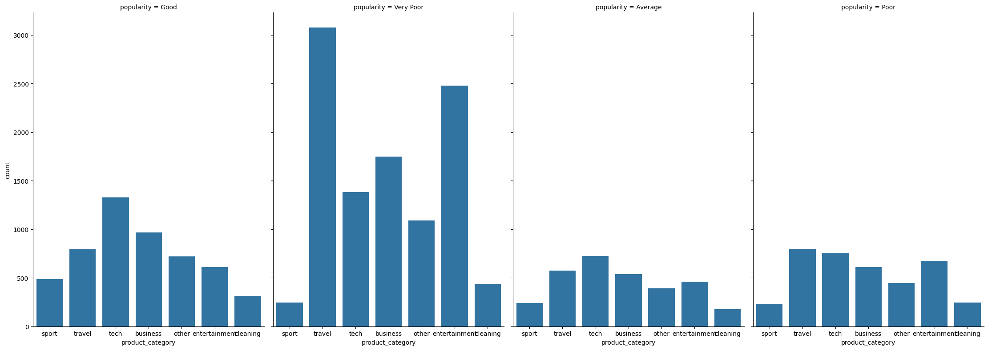

In [171]:
#the ranking of the channels in regards to the shares popularity
temp_data = data[(data['popularity'] == 'Very Poor') | (data['popularity'] == 'Poor') | (data['popularity'] == 'Average') | (data['popularity'] == 'Good')]
ax = sns.catplot(x='product_category', col="popularity", data=temp_data, kind="count", height=8, aspect=.7)

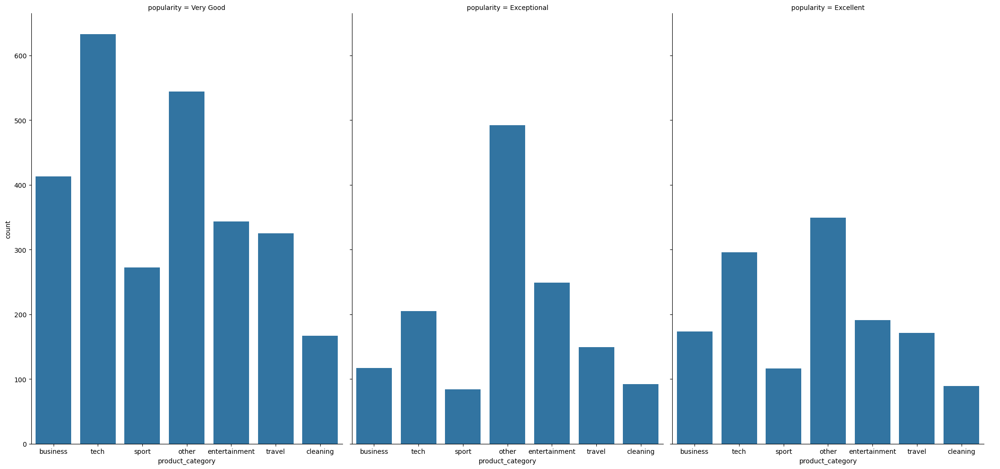

In [172]:
# shows relationship with the number of shares and the ranking of the channels (compare only the best three popularity)
temp_data = data[(data['popularity'] == 'Exceptional') | (data['popularity'] == 'Excellent') | (data['popularity'] == 'Very Good')]
ax = sns.catplot(x='product_category', col="popularity", data=temp_data, kind="count", height=10, aspect=.7)

<Axes: xlabel='popularity', ylabel=' num_imgs'>

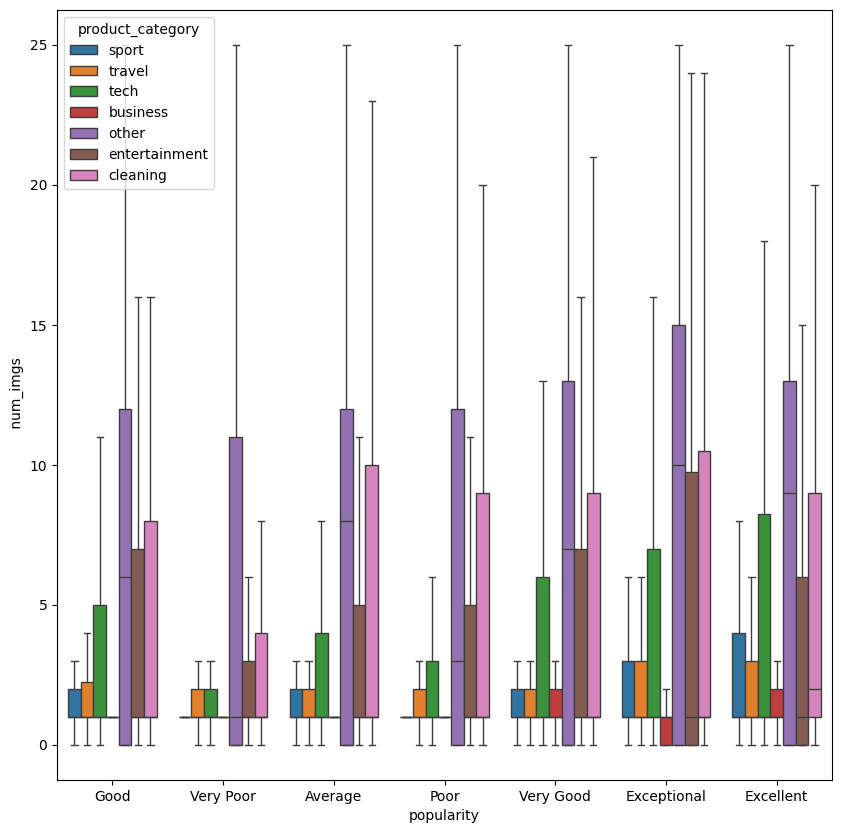

In [173]:
fig,ax = plt.subplots(figsize=(10,10))
temp_data = data[data[' num_imgs'] <= 25]
sns.boxplot(x='popularity',y=' num_imgs', hue='product_category', data=temp_data, showfliers=False)

# Making Recommendations For Good Articles

<Axes: xlabel=' n_tokens_review', ylabel='popularity'>

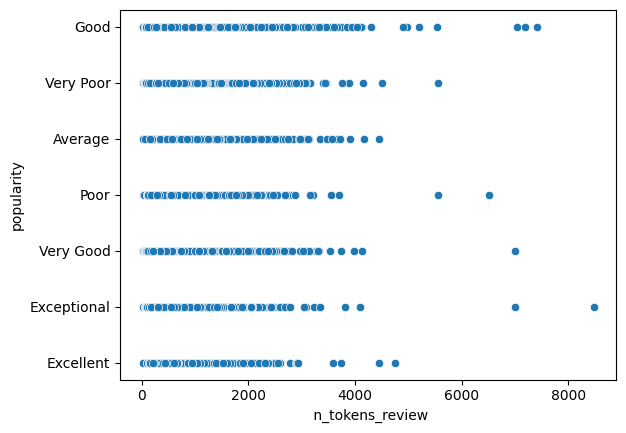

In [174]:
#n_tokens_content
sns.scatterplot(x=' n_tokens_review',y='popularity', data=data)

<Axes: xlabel=' n_tokens_title', ylabel=' shares'>

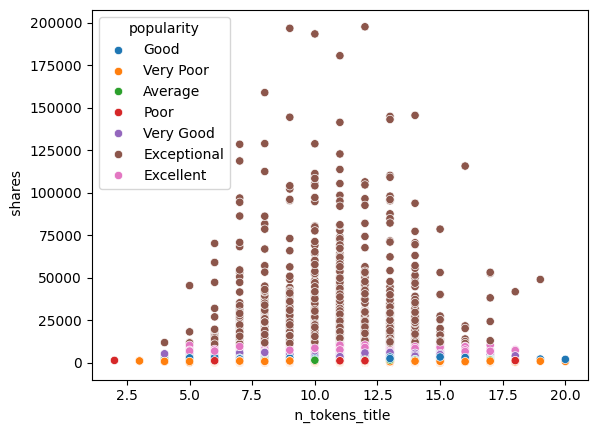

In [175]:
#n_tokens_title
temp_data = data[data[' shares'] <= 200000]
sns.scatterplot(x=' n_tokens_title',y=' shares', hue='popularity', data=temp_data)

<Axes: xlabel=' n_unique_tokens', ylabel=' shares'>

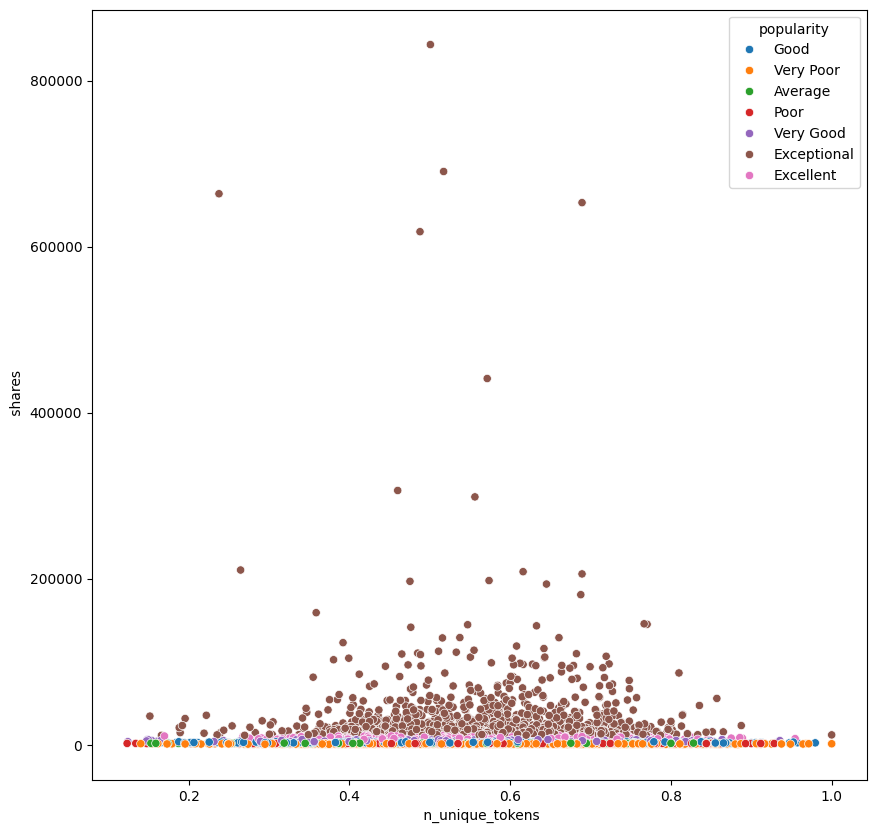

In [176]:
#n_tokens_title
temp_data = data[data[' shares'] <= 200000]
plt.figure(figsize=(10,10))
sns.scatterplot(x=' n_unique_tokens',y=' shares', hue='popularity', data=data)

<Axes: xlabel=' num_hrefs', ylabel=' shares'>

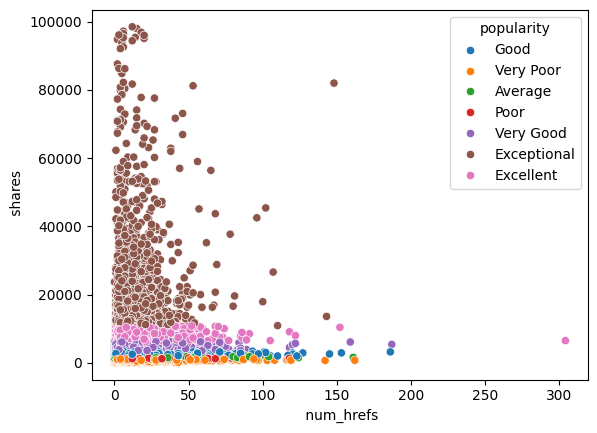

In [177]:
#num_hrefs
temp_data = data[data[' shares'] <= 100000]
sns.scatterplot(x=' num_hrefs',y=' shares', hue='popularity', data=temp_data)

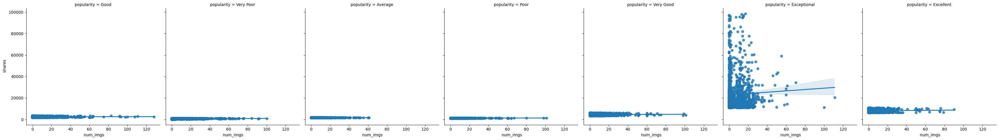

In [178]:
#num_imgs
temp_data = data[data[' shares'] <= 100000]
#plt.figure(figsize=(30,10))
#sns.barplot(x=' num_imgs',y=' shares', hue='popularity', data=temp_data)
sns.lmplot(x=' num_imgs', y=' shares', col='popularity', data=temp_data)

(17951, 49)


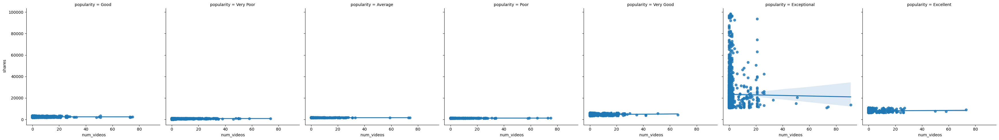

In [179]:
#num_videos
temp_data = data[data[' shares'] <= 100000]
noise_data  = data[data[' num_videos'] == 0]
print (noise_data.shape)
#plt.figure(figsize=(30,10))
#sns.barplot(x=' num_imgs',y=' shares', hue='popularity', data=temp_data)
sns.lmplot(x=' num_videos', y=' shares', col='popularity', data=temp_data)

(0, 49)


<Axes: xlabel=' average_token_length', ylabel=' shares'>

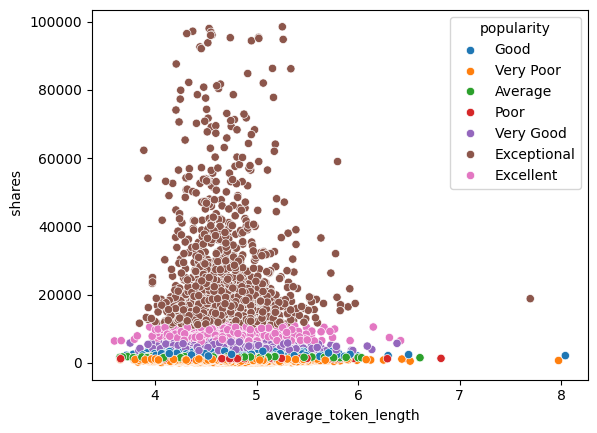

In [180]:
#average_token_length
temp_data = data[data[' shares'] <= 100000]
noise_data  = data[data[' average_token_length'] == 0]
print (noise_data.shape)
#plt.figure(figsize=(30,10))
sns.scatterplot(x=' average_token_length',y=' shares', hue='popularity', data=temp_data)

(0, 49)


<Axes: xlabel=' num_keywords', ylabel=' shares'>

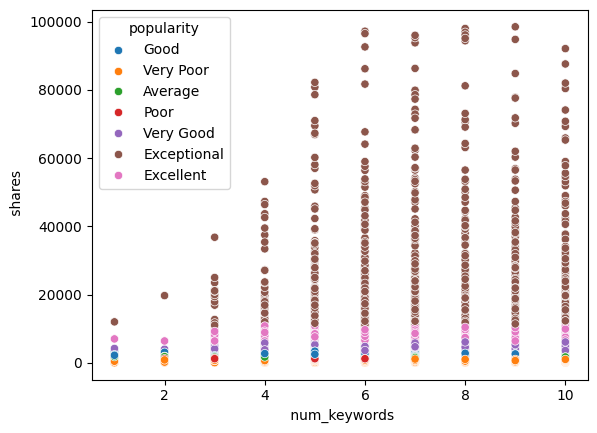

In [181]:
#num_keywords
temp_data = data[data[' shares'] <= 100000]
noise_data  = data[data[' num_keywords'] == 0]
print (noise_data.shape)
#plt.figure(figsize=(30,10))
sns.scatterplot(x=' num_keywords',y=' shares', hue='popularity', data=temp_data)

(4365, 49)


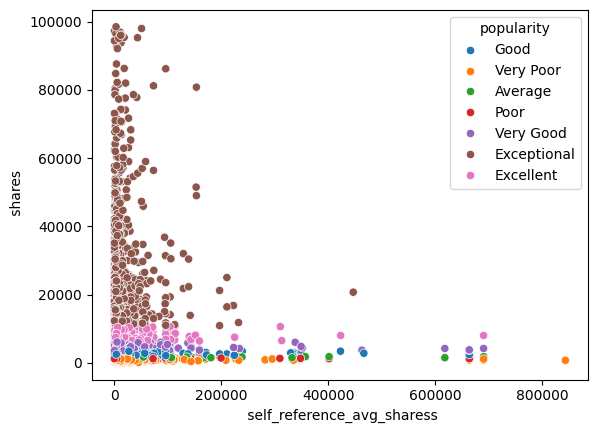

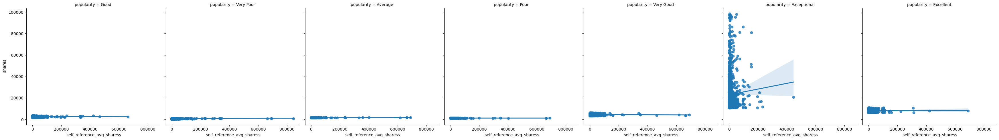

In [182]:
#self_reference_avg_sharess
temp_data = data[data[' shares'] <= 100000]
noise_data  = data[data[' self_reference_avg_sharess'] == 0]
print (noise_data.shape)
#plt.figure(figsize=(30,10))
sns.scatterplot(x=' self_reference_avg_sharess',y=' shares', hue='popularity', data=temp_data)
sns.lmplot(x=' self_reference_avg_sharess', y=' shares', col='popularity', data=temp_data)

# Normal Distribution analysis for 'Shares'

In [183]:
print("Skewness: %f" % data[' shares'].skew())
print("Kurtosis: %f" % data[' shares'].kurt())

Skewness: 35.679641
Kurtosis: 1854.968396


C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\636699180.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[' shares'], fit=norm);


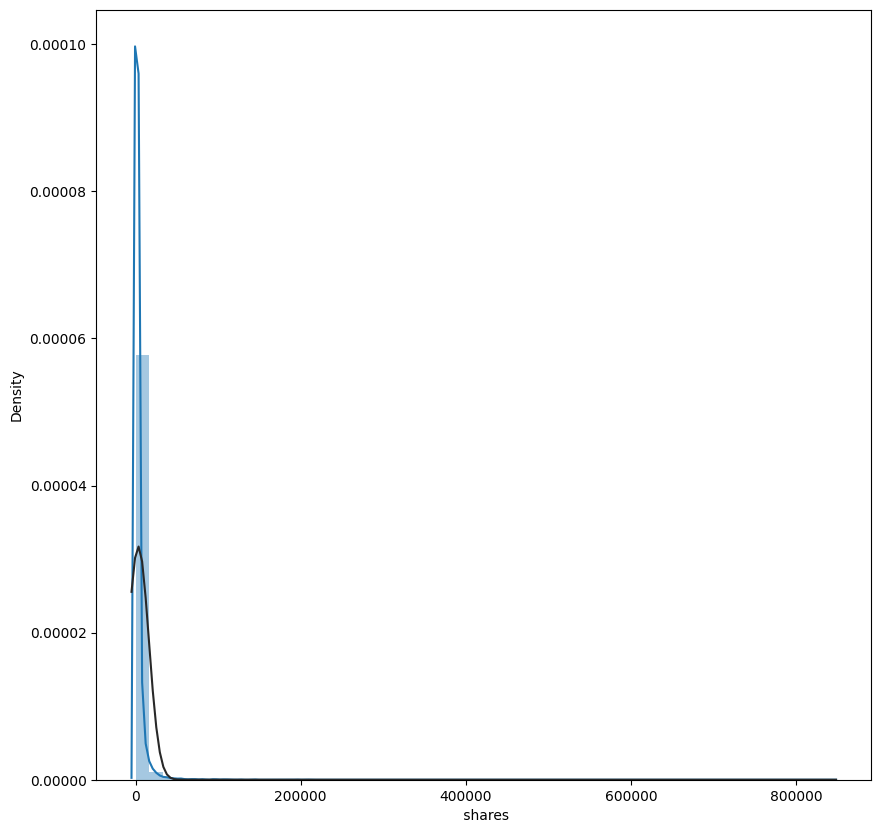

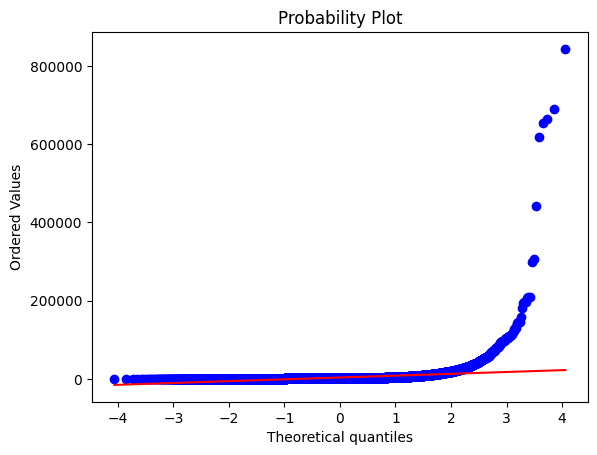

In [184]:
from scipy.stats import norm, probplot

#histogram and normal probability plot
temp_data = data[data[' shares'] <= 100000]
fig,ax = plt.subplots(figsize=(10,10))
sns.distplot(data[' shares'], fit=norm);
fig = plt.figure()
res = probplot(data[' shares'], plot=plt)

In [185]:
from copy import copy

C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\3501203638.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[7.69621264 6.70441435 6.90775528 ... 7.09007684 7.09007684 7.82404601]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  new_shares_data.loc[new_shares_data[' shares'] > 0, ' shares'] = np.log(data.loc[data[' shares'] > 0, ' shares'])
C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\3501203638.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_shares_log, fit=norm);


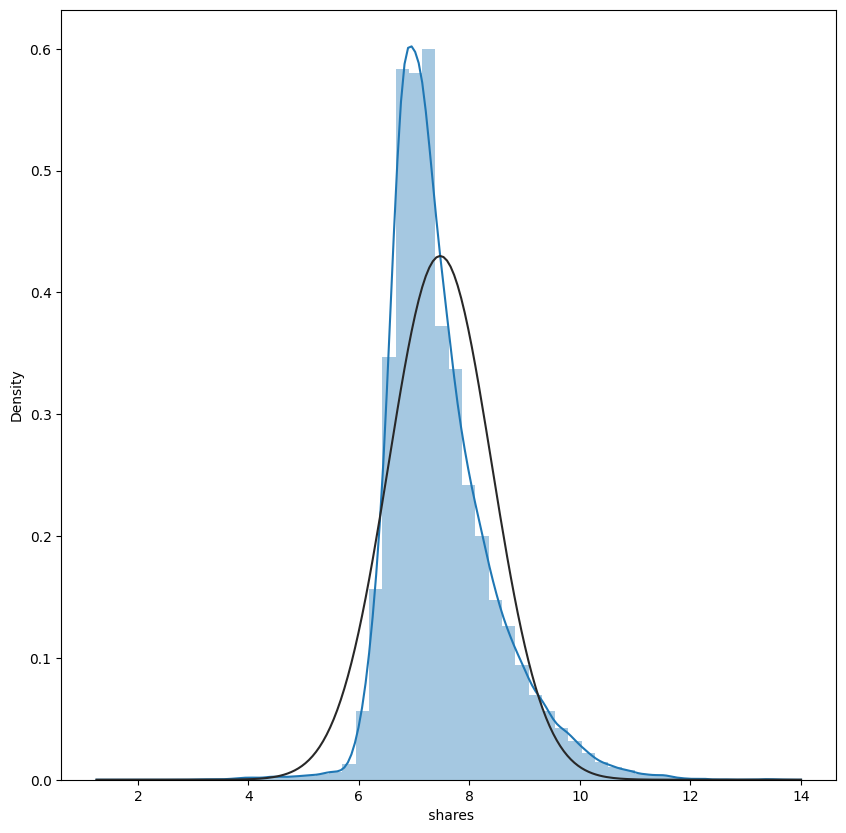

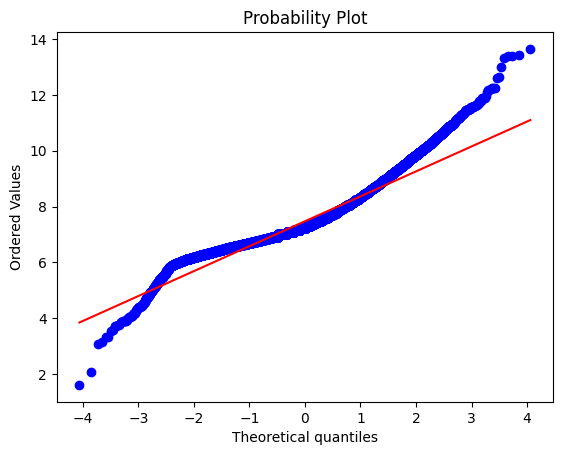

In [186]:
#applying log transformation
new_shares_data = copy(data)

new_shares_data.loc[new_shares_data[' shares'] > 0, ' shares'] = np.log(data.loc[data[' shares'] > 0, ' shares'])
new_shares_log = new_shares_data[' shares']
#transformed histogram and normal probability plot
fig,ax = plt.subplots(figsize=(10,10))
sns.distplot(new_shares_log, fit=norm);
fig = plt.figure()
res = probplot(new_shares_log, plot=plt)

In [187]:
#Check for missing data
total = new_shares_data.isnull().sum().sort_values(ascending=False)
percent = (new_shares_data.isnull().sum()/new_shares_data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

,Total,Percent
age_days,0,0.0
day,0,0.0
topic_shipping,0,0.0
topic_packaging,0,0.0
topic_description,0,0.0


# Feature Extraction & Selection


In [188]:
# shares data is not needed for classification
data_without_shares = data.drop(labels=[' shares'], axis = 1, inplace=False)

training_set = data_without_shares.iloc[:, :(data_without_shares.shape[1]-1)]
# convert categorical variables into dummy - it use one-hot encoding
training_set = pd.get_dummies(training_set)

# extract the label data in this case popularity
label_set = data_without_shares.iloc[:, (data_without_shares.shape[1]-1):].values

data_feature2 = copy(training_set)

In [189]:
# only the best observed features are extracted here
data_feature1 =training_set[[' n_tokens_title',' n_tokens_review',' n_unique_tokens',' num_hrefs',
                       ' num_self_hrefs',' num_imgs',' num_videos',' average_token_length',' num_keywords',
                       ' kw_avg_avg',' self_reference_avg_sharess',' global_subjectivity',
                       ' global_sentiment_polarity',' global_rate_positive_words',' global_rate_negative_words',' avg_positive_polarity',
                       ' avg_negative_polarity',' title_sentiment_polarity','day_friday', 'day_monday', 'day_saturday',
       'day_sunday', 'day_thursday', 'day_tuesday',
       'day_wednesday', 'product_category_sport',
       'product_category_travel', 'product_category_tech',
       'product_category_other', 'product_category_entertainment', 'product_category_cleaning',
       'product_category_business']]

In [190]:
data_feature1.columns

Index([' n_tokens_title', ' n_tokens_review', ' n_unique_tokens', ' num_hrefs',
       ' num_self_hrefs', ' num_imgs', ' num_videos', ' average_token_length',
       ' num_keywords', ' kw_avg_avg', ' self_reference_avg_sharess',
       ' global_subjectivity', ' global_sentiment_polarity',
       ' global_rate_positive_words', ' global_rate_negative_words',
       ' avg_positive_polarity', ' avg_negative_polarity',
       ' title_sentiment_polarity', 'day_friday', 'day_monday', 'day_saturday',
       'day_sunday', 'day_thursday', 'day_tuesday', 'day_wednesday',
       'product_category_sport', 'product_category_travel',
       'product_category_tech', 'product_category_other',
       'product_category_entertainment', 'product_category_cleaning',
       'product_category_business'],
      dtype='object')

In [191]:
# helper function for evalating the fisher ndex
def fisher_index_calc(trainingSet, labelSet):
    (dim1_T, dim2_T) = trainingSet.shape
    (dim1_L, dim2_L) = labelSet.shape

    # create the fisher output variable - A vector of all the features
    fisher_ratios = np.zeros((1, dim2_T), dtype=float).flatten()
    # It's expected that the dim1_T and dim1_L be of the same size, else this input parameters is nulled.
    if dim1_L != dim1_T:
        return fisher_ratios

    # First extract out the number of features available.
    # grouped both data together, and create a pandas dataframe from it.
    train1 = pd.DataFrame(trainingSet)
    label1 = pd.DataFrame(labelSet, columns=['LABEL'])
    grouped = pd.concat([train1, label1], axis=1)

    # fetch the number of classes
    (no_classes, demo) = grouped.groupby('LABEL').count()[[0]].shape
    #print grouped

    # loop through all features
    for j in range(dim2_T):
        # the variance of the feature j
        j_variance = np.var(trainingSet[:,j])
        j_mean = np.mean(trainingSet[:,j])
        j_summation = 0
        for k in range(no_classes):
            output = grouped.groupby('LABEL').count()[[j]]
            k_feature_count = output.iloc[k,0]
            # mean for class k of feature j
            output = grouped.groupby('LABEL').mean()[[j]]
            k_feature_mean = output.iloc[k,0]
            currentSum = k_feature_count * np.square((k_feature_mean - j_mean))
            j_summation = j_summation + currentSum
        fisher_ratios[j] = j_summation / np.square(j_variance)

    return fisher_ratios

In [192]:
# calculates the fisher score of the features
fisher_scores = fisher_index_calc(training_set.values, label_set)

df = pd.DataFrame({'Fisher Ratio For All Features': fisher_scores})

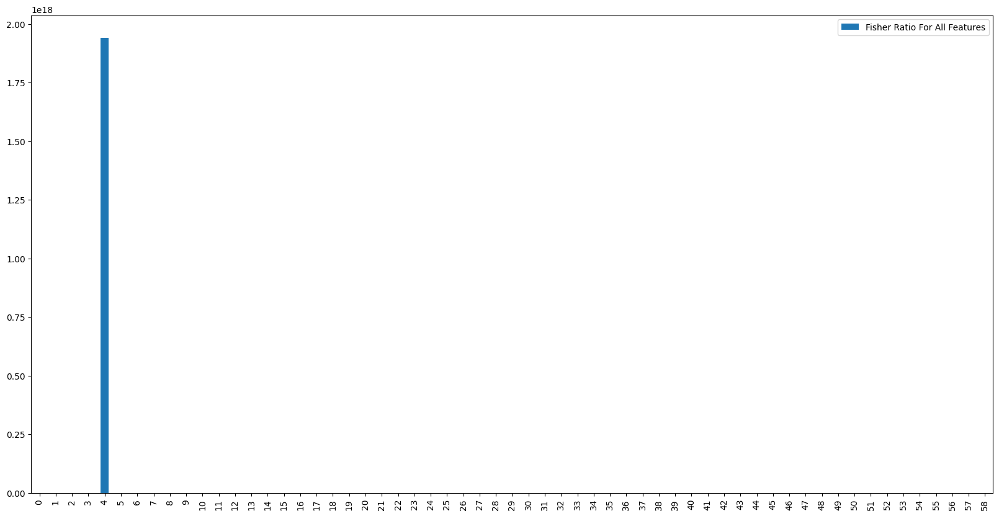

In [193]:
# plot the fisher analysis score
ax = df.plot.bar(figsize=(20,10))
plt.show()

In [194]:
# feature selection based on fisher score
# Fisher Index Ratio Filter - Remove features with low score
# indices of features to remove based on fisher ratios
to_remove = []
for i in range((len(fisher_scores))):
    if fisher_scores[i] < 3000:
        # we mark for removal
        to_remove.append(i)

# remove features with low fisher score
data_feature_fisher = training_set.drop(training_set.columns[to_remove], axis=1, inplace=False)
print ("fisher based features - ", data_feature_fisher.shape)
data_feature_fisher.columns

fisher based features -  (28000, 26)


Index([' n_unique_tokens', ' n_non_stop_words', ' n_non_stop_unique_tokens',
       'topic_quality', 'topic_shipping', 'topic_packaging',
       'topic_description', 'topic_others', ' global_subjectivity',
       ' global_sentiment_polarity', ' global_rate_positive_words',
       ' global_rate_negative_words', ' rate_positive_words',
       ' rate_negative_words', ' avg_positive_polarity',
       ' min_positive_polarity', ' max_positive_polarity',
       ' avg_negative_polarity', ' max_negative_polarity',
       'product_category_entertainment', 'product_category_other',
       'product_category_sport', 'product_category_tech',
       'product_category_travel', 'day_saturday', 'day_sunday'],
      dtype='object')

## Finding the normal distribution of the dataset

In [195]:
# use log transformation to transform each features to a normal distribution
training_set_normal = copy(training_set)

# note log transformation can only be performed on data without zero value
for col in training_set_normal.columns:
    #applying log transformation
    temp = training_set_normal[training_set_normal[col] == 0]
    # only apply to non-zero features
    if temp.shape[0] == 0:
        training_set_normal[col] = np.log(training_set_normal[col])
        print (col)
    else:
        # attempt to only transform the positive values alone
        training_set_normal.loc[training_set_normal[col] > 0, col] = np.log(training_set_normal.loc[training_set_normal[col] > 0, col])

age_days
 n_tokens_title
 n_tokens_review
 n_unique_tokens
 n_non_stop_words
 n_non_stop_unique_tokens
 average_token_length
 num_keywords
topic_quality
topic_shipping
topic_packaging
topic_description
topic_others


C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\307512786.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.94591015 1.38629436 2.07944154 ... 3.4657359  2.48490665 2.48490665]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  training_set_normal.loc[training_set_normal[col] > 0, col] = np.log(training_set_normal.loc[training_set_normal[col] > 0, col])
C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\307512786.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.94591015 0.69314718 1.09861229 ... 1.09861229 3.29583687 2.30258509]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  training_set_normal.loc[training_set_normal[col] > 0, col] = np.log(training_set_normal.loc[training_set_normal[col] > 0, col])
C:\Users\maxno\AppData\Local

In [196]:
# only the best observed features are extracted here
data_feature1_normal =training_set_normal[[' n_tokens_title',' n_tokens_review',' n_unique_tokens',' num_hrefs',
                       ' num_self_hrefs',' num_imgs',' num_videos',' average_token_length',' num_keywords',
                       ' kw_avg_avg',' self_reference_avg_sharess',' global_subjectivity',
                       ' global_sentiment_polarity',' global_rate_positive_words',' global_rate_negative_words',' avg_positive_polarity',
                       ' avg_negative_polarity',' title_sentiment_polarity','day_friday', 'day_monday', 'day_saturday',
       'day_sunday', 'day_thursday', 'day_tuesday',
       'day_wednesday', 'product_category_sport',
       'product_category_travel', 'product_category_tech',
       'product_category_other', 'product_category_entertainment', 'product_category_cleaning',
       'product_category_business']]

C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\3049805801.py:36: RuntimeWarning: invalid value encountered in scalar divide
  fisher_ratios[j] = j_summation / np.square(j_variance)
C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\3049805801.py:36: RuntimeWarning: invalid value encountered in scalar divide
  fisher_ratios[j] = j_summation / np.square(j_variance)
C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\3049805801.py:36: RuntimeWarning: invalid value encountered in scalar divide
  fisher_ratios[j] = j_summation / np.square(j_variance)
C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\3049805801.py:36: RuntimeWarning: invalid value encountered in scalar divide
  fisher_ratios[j] = j_summation / np.square(j_variance)
C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\3049805801.py:36: RuntimeWarning: invalid value encountered in scalar divide
  fisher_ratios[j] = j_summation / np.square(j_variance)
C:\Users\maxno\AppData\Local\Temp\ipykernel_17548\3049805801.py:36: RuntimeWarni

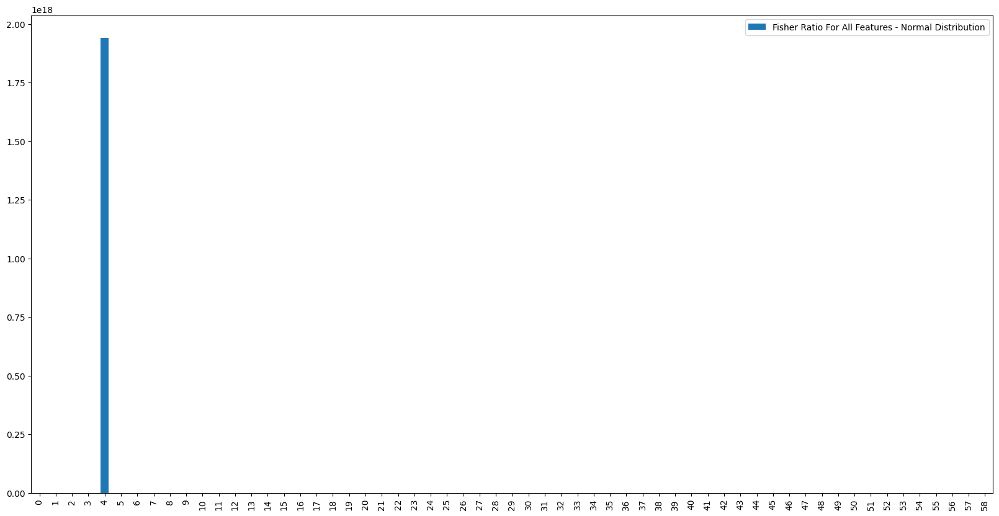

In [197]:
# calculates the fisher score of the features
fisher_scores_normal = fisher_index_calc(training_set_normal.values, label_set)

df = pd.DataFrame({'Fisher Ratio For All Features - Normal Distribution': fisher_scores_normal})
# plot the fisher analysis score
ax = df.plot.bar(figsize=(20,10))
plt.show()

In [198]:
# feature selection based on fisher score
# Fisher Index Ratio Filter - Remove features with low score
# indices of features to remove based on fisher ratios
to_remove = []
for i in range((len(fisher_scores_normal))):
    if fisher_scores_normal[i] < 1000:
        # we mark for removal
        to_remove.append(i)

# remove features with low fisher score
data_feature_fisher_normal = training_set_normal.drop(training_set_normal.columns[to_remove], axis=1, inplace=False)
# ihave about 25 features left.
print ("fisher based features : Normal distributions - ", data_feature_fisher_normal.shape)
data_feature_fisher_normal.columns

fisher based features : Normal distributions -  (28000, 29)


Index([' n_tokens_title', ' n_unique_tokens', ' n_non_stop_words',
       ' n_non_stop_unique_tokens', ' average_token_length', ' num_keywords',
       ' kw_max_avg', ' kw_avg_avg', ' global_subjectivity',
       ' global_rate_positive_words', ' rate_positive_words',
       ' avg_positive_polarity', ' max_positive_polarity',
       ' avg_negative_polarity', ' max_negative_polarity',
       'product_category_business', 'product_category_cleaning',
       'product_category_entertainment', 'product_category_other',
       'product_category_sport', 'product_category_tech',
       'product_category_travel', 'day_friday', 'day_monday', 'day_saturday',
       'day_sunday', 'day_thursday', 'day_tuesday', 'day_wednesday'],
      dtype='object')

In [199]:
data_feature2_normal = copy(training_set_normal)

## Visulazing the impact of normal distribution on the data

In [200]:
temp_data_normal = pd.concat([training_set_normal, pd.DataFrame(new_shares_log, columns=[' shares'])], axis=1)
label_set6 = data_without_shares.iloc[:, (data_without_shares.shape[1]-1):]
temp_data_normal = pd.concat([temp_data_normal, label_set6], axis=1)

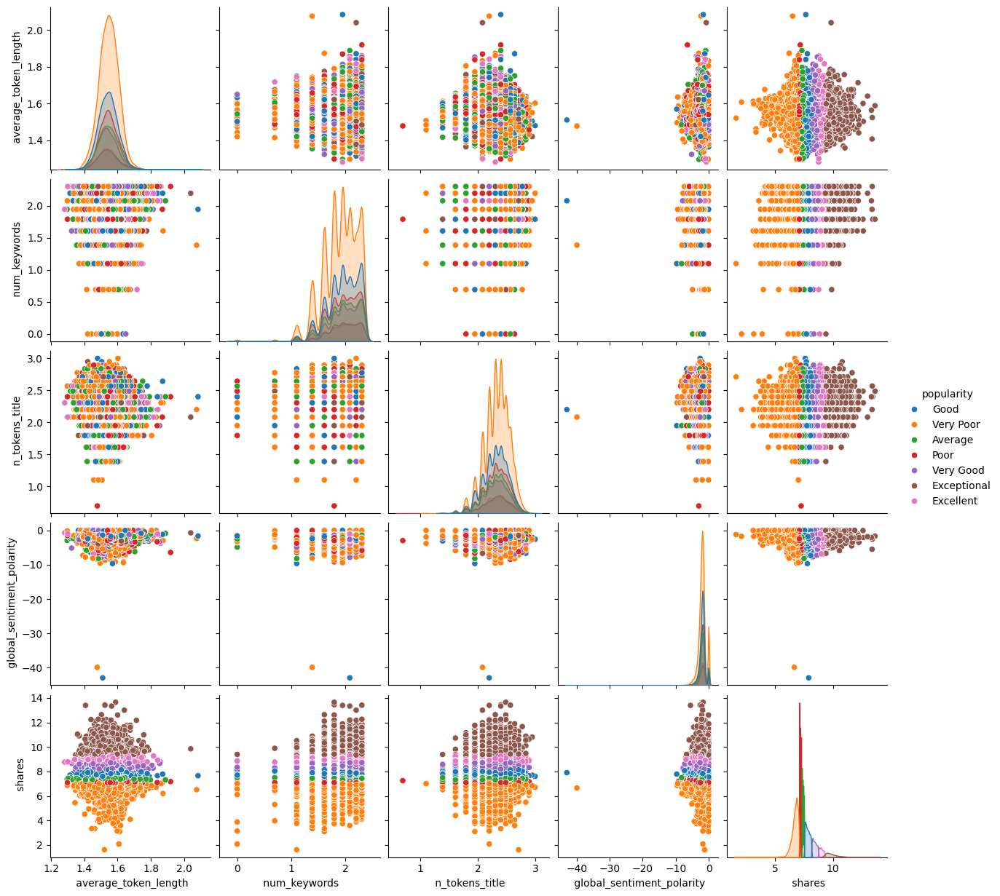

In [201]:
temp_data = temp_data_normal[temp_data_normal[' shares'] <= 100000]
# running a pair plot for the kw__terms
kw_cols = [' average_token_length', ' num_keywords', ' n_tokens_title', ' global_sentiment_polarity', ' shares']
# run a pairplot
sns.pairplot(temp_data_normal, vars=kw_cols, hue='popularity', diag_kind='kde')

<Axes: xlabel=' num_keywords', ylabel=' shares'>

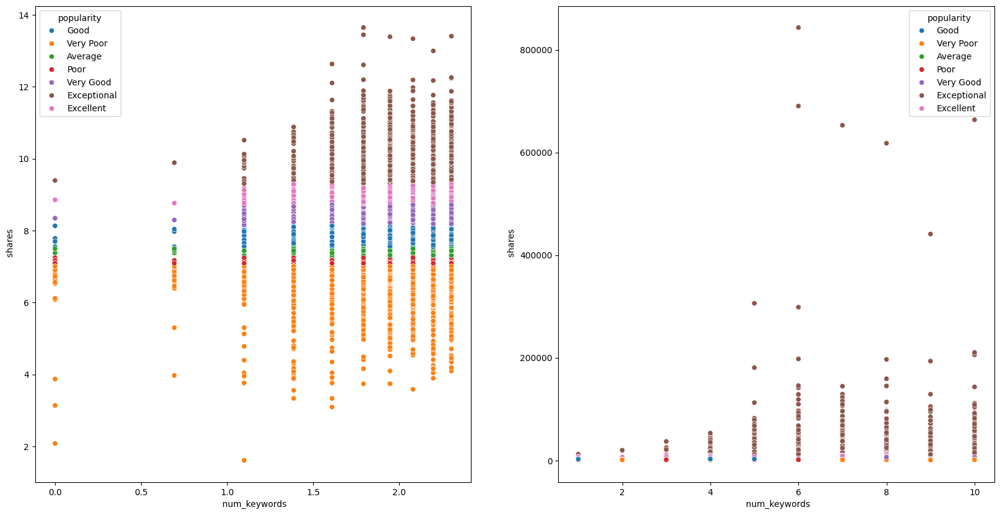

In [202]:
#n_tokens_title
fig, axs = plt.subplots(figsize=(20,10), nrows=1,ncols=2)
sns.scatterplot(x=' num_keywords',y=' shares', hue='popularity', data=temp_data_normal, ax=axs[0])
sns.scatterplot(x=' num_keywords',y=' shares', hue='popularity', data=data, ax=axs[1])

<Axes: xlabel=' n_tokens_review', ylabel=' shares'>

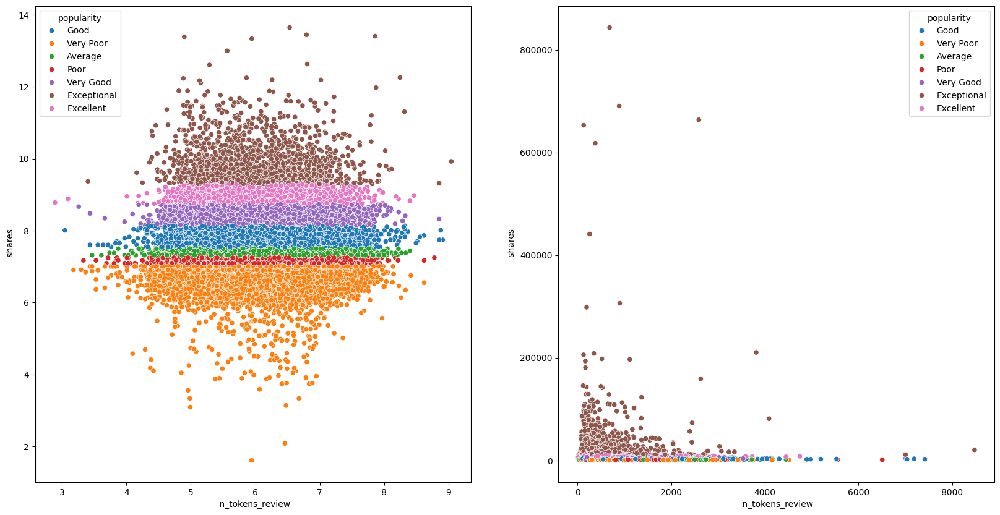

In [203]:
#n_tokens_content
fig, axs = plt.subplots(figsize=(20,10), nrows=1,ncols=2)
sns.scatterplot(x=' n_tokens_review',y=' shares', hue='popularity', data=temp_data_normal, ax=axs[0])
sns.scatterplot(x=' n_tokens_review',y=' shares', hue='popularity', data=data, ax=axs[1])

<Axes: xlabel=' title_subjectivity', ylabel=' shares'>

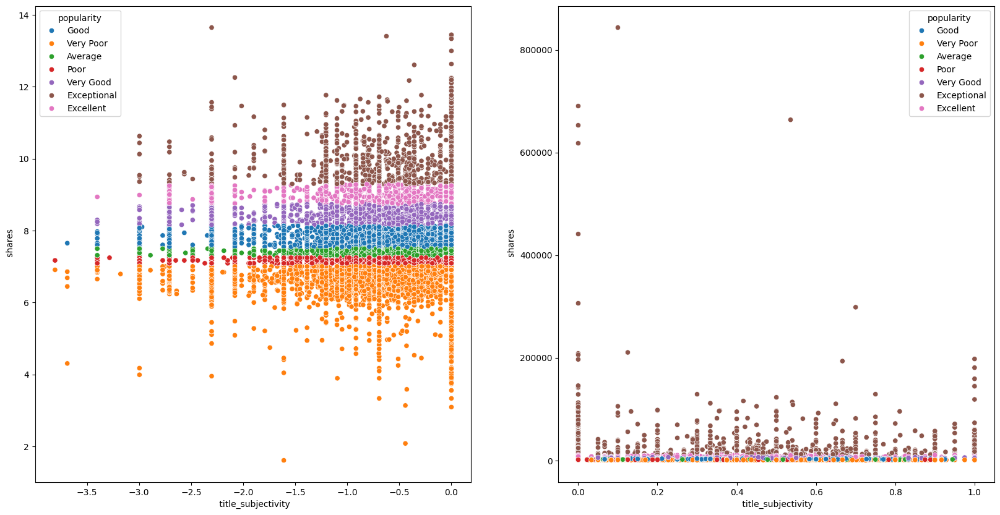

In [204]:
#title_subjectivity
fig, axs = plt.subplots(figsize=(20,10), nrows=1,ncols=2)
sns.scatterplot(x=' title_subjectivity',y=' shares', hue='popularity', data=temp_data_normal, ax=axs[0])
sns.scatterplot(x=' title_subjectivity',y=' shares', hue='popularity', data=data, ax=axs[1])

# Machine Learning - Supervised Learning Classification

In [206]:
# normalizaling the data with standard scaler
# we will normalized all the features selections

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# scalled all the feature selections
data_feature1_nor = scaler.fit_transform(data_feature1.values)
data_feature2_nor = scaler.fit_transform(data_feature2.values)
data_feature_fisher_nor = scaler.fit_transform(data_feature_fisher.values)
data_feature1_normal_nor = scaler.fit_transform(data_feature1_normal.values)
data_feature_fisher_normal_nor = scaler.fit_transform(data_feature_fisher_normal.values)
data_feature2_normal_nor = scaler.fit_transform(data_feature2_normal.values)

features_selection = [data_feature1_nor, data_feature2_nor, data_feature_fisher_nor, data_feature1_normal_nor, 
                     data_feature_fisher_normal_nor, data_feature2_normal_nor]

features_selection_labels = ['Features on Hypothesis', 'All Features', 'Fisher based Features', 
                             'Features on Hypothesis - Normal Distribution', 'Fisher based Features - Normal Distribution',
                             'All Features - Normal Distribution']

In [207]:
data.head(n=5)

,age_days,n_tokens_title,n_tokens_review,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,popularity
0,436,9,532,0.462264,1.0,0.594427,7,7,1,0,...,1.0,-0.180556,-0.25,-0.125,0.50,0.500,0.00,0.500,2200,Good
1,185,16,1012,0.446247,1.0,0.638112,4,2,3,11,...,0.9,-0.318981,-1.00,-0.050,0.05,-0.075,0.45,0.075,816,Very Poor
2,210,12,506,0.546559,1.0,0.693291,8,3,2,1,...,0.5,-0.292708,-0.75,-0.100,0.00,0.000,0.50,0.000,1000,Very Poor
3,723,11,241,0.543933,1.0,0.648649,5,4,1,1,...,0.7,0.000000,0.00,0.000,0.00,0.000,0.50,0.000,660,Very Poor
4,345,11,983,0.405930,1.0,0.594747,11,7,1,1,...,1.0,-0.256481,-0.80,-0.050,0.00,0.000,0.50,0.000,1000,Very Poor


In [208]:
# encoding the label set with a label encoder
from sklearn.preprocessing import LabelEncoder

labelEn = LabelEncoder()
encoded_labels = labelEn.fit_transform(data.loc[:, 'popularity'].values)
class_names = labelEn.classes_
class_names

array(['Average', 'Excellent', 'Exceptional', 'Good', 'Poor', 'Very Good',
       'Very Poor'], dtype=object)

In [209]:
# Splitting the data for Training and Testing
from sklearn.model_selection import train_test_split, GridSearchCV

# train and test for a feature selections
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(data_feature1_nor, encoded_labels, test_size=0.3, shuffle=False)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(data_feature2_nor, encoded_labels, test_size=0.3, shuffle=False)
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(data_feature_fisher_nor, encoded_labels, test_size=0.3, shuffle=False)
X_train_4, X_test_4, y_train_4, y_test_4 = train_test_split(data_feature1_normal_nor, encoded_labels, test_size=0.3, shuffle=False)
X_train_5, X_test_5, y_train_5, y_test_5 = train_test_split(data_feature_fisher_normal_nor, encoded_labels, test_size=0.3, shuffle=False)
X_train_6, X_test_6, y_train_6, y_test_6 = train_test_split(data_feature2_normal_nor, encoded_labels, test_size=0.3, shuffle=False)

In [210]:
from sklearn.metrics import accuracy_score, make_scorer

In [211]:
features_selection[4].shape

(28000, 29)

In [212]:
encoded_labels.shape

(28000,)

In [213]:
# function for confusion matrix

import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    print(cm)

    fig, ax = plt.subplots(figsize=(10,10))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.32f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout(pad=5, rect= (0, 0, 1, 1))
    return ax

## Random Forest Classifier

In [214]:
from sklearn.ensemble import RandomForestClassifier

nns = [1, 5, 10, 50, 100, 200, 500, 1000, 2000, 3000]
accuracy = []

for n in nns:    
    clf = RandomForestClassifier(n_estimators=n, n_jobs=5, max_depth=50,
                                 random_state=0)
    clf.fit(X_train_2, y_train_2)  

    # predict the result
    y_pred = clf.predict(X_test_2)
    #print ("Random Forest Classifer Result")
    #print ("Performance - " + str(100*accuracy_score(y_pred, y_test_2)) + "%")
    accuracy.append(100*accuracy_score(y_pred, y_test_2))

In [215]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=1000, n_jobs=-1, max_depth=50,
                             random_state=0)
clf.fit(X_train_2, y_train_2)  

# predict the result
y_pred = clf.predict(X_test_2)
print ("Random Forest Classifer Result")
print ("Performance - " + str(100*accuracy_score(y_pred, y_test_2)) + "%")

Random Forest Classifer Result
Performance - 40.14285714285714%


[[   2    0   10  211    5   14  700]
 [   2    0   14  142    1   26  260]
 [   1    0   21  115    1   28  278]
 [   6    1   19  531    5   33  977]
 [   5    0    7  192    7   16  952]
 [   3    0   12  258    1   29  464]
 [   3    3   13  218    8   24 2782]]


<Axes: title={'center': 'Confusion matrix For Random Forest'}, xlabel='Predicted label', ylabel='True label'>

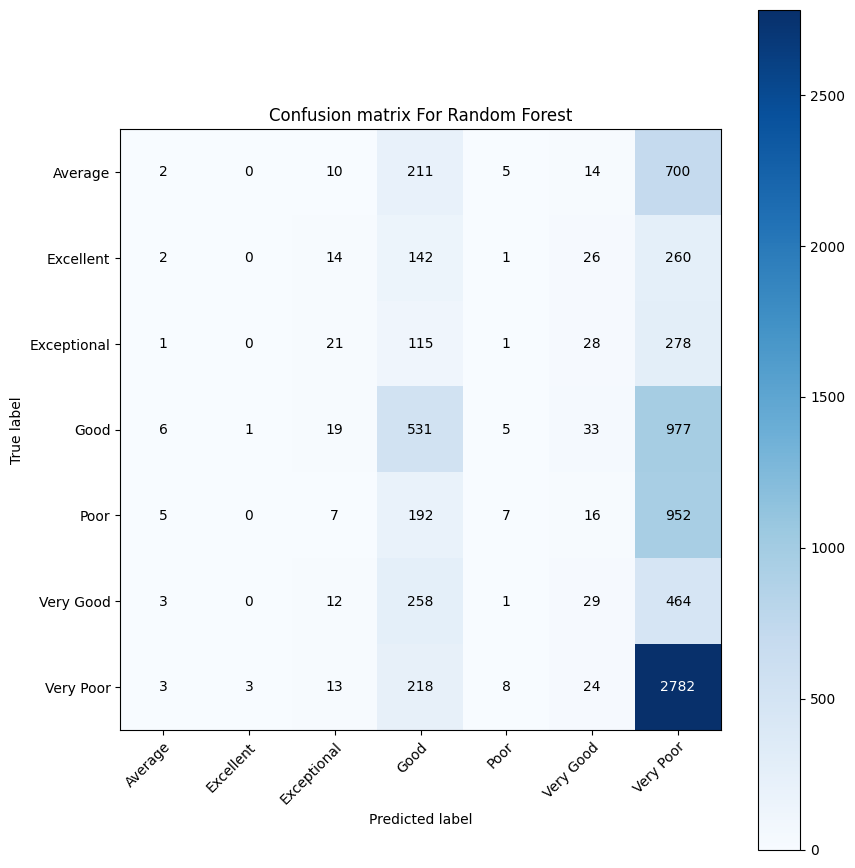

In [216]:
# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test_2, y_pred, classes=class_names,
                      title='Confusion matrix For Random Forest')

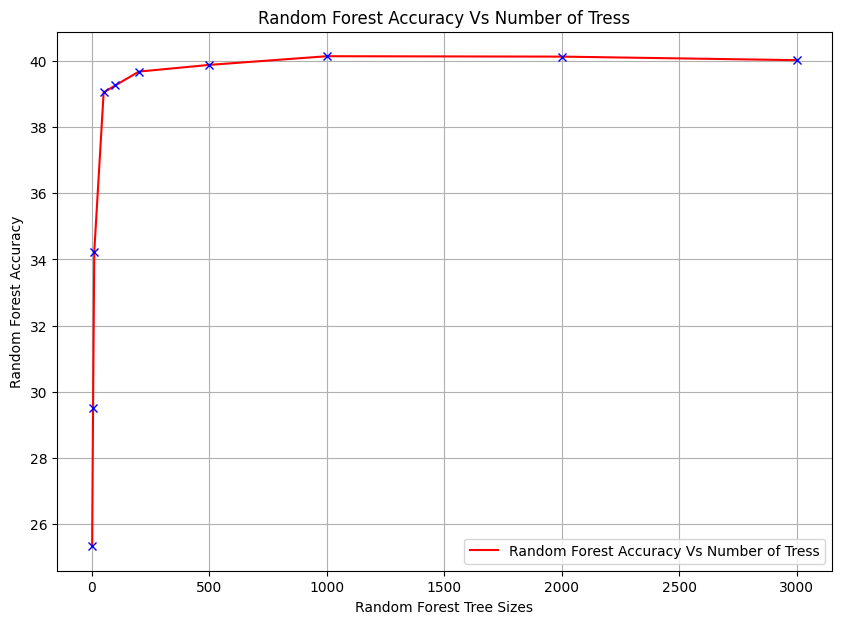

In [217]:
plt.figure(figsize=(10,7))
plt.plot(nns, accuracy, 'r-', label='Random Forest Accuracy Vs Number of Tress')
plt.plot(nns, accuracy, 'bx')
plt.xlabel('Random Forest Tree Sizes')
plt.ylabel('Random Forest Accuracy')
plt.legend()
plt.grid()
plt.title('Random Forest Accuracy Vs Number of Tress')
plt.show()

In [218]:
# iterating through all the possible features

clf = RandomForestClassifier(n_estimators=1000, n_jobs=5, max_depth=50,
                                 random_state=0)

for i in range(len(features_selection)):
    X_train, X_test, y_train, y_test = train_test_split(features_selection[i], encoded_labels, test_size=0.3, shuffle=False)
        
    # commence training 
    clf.fit(X_train, y_train)

    # predict the result
    y_pred = clf.predict(X_test)
    
    print("Result for using Feature Selection - ", features_selection_labels[i])
    print ("Random Forest Classifer Result")
    print ("Performance - " + str(100*accuracy_score(y_pred, y_test)) + "%")

Result for using Feature Selection -  Features on Hypothesis
Random Forest Classifer Result
Performance - 39.33333333333333%
Result for using Feature Selection -  All Features
Random Forest Classifer Result
Performance - 40.14285714285714%
Result for using Feature Selection -  Fisher based Features
Random Forest Classifer Result
Performance - 38.63095238095238%
Result for using Feature Selection -  Features on Hypothesis - Normal Distribution
Random Forest Classifer Result
Performance - 37.69047619047619%
Result for using Feature Selection -  Fisher based Features - Normal Distribution
Random Forest Classifer Result
Performance - 36.833333333333336%
Result for using Feature Selection -  All Features - Normal Distribution
Random Forest Classifer Result
Performance - 39.13095238095238%


## SVM - Support Vector Machines

In [222]:
from sklearn.svm import SVC

svc_grid = SVC(gamma='auto')

# iterating through all the possible features

for i in range(len(features_selection)):
    X_train, X_test, y_train, y_test = train_test_split(features_selection[i], encoded_labels, test_size=0.3, shuffle=False)
        
    # commence training 
    svc_grid.fit(X_train, y_train)

    # predict the result
    y_pred = svc_grid.predict(X_test)
    
    print("Result for using Feature Selection - ", features_selection_labels[i])
    print ("SVC Classifer Result")
    print ("Performance - " + str(100*accuracy_score(y_pred, y_test)) + "%")

Result for using Feature Selection -  Features on Hypothesis
SVC Classifer Result
Performance - 39.63095238095239%
Result for using Feature Selection -  All Features
SVC Classifer Result
Performance - 40.19047619047619%
Result for using Feature Selection -  Fisher based Features
SVC Classifer Result
Performance - 39.19047619047619%
Result for using Feature Selection -  Features on Hypothesis - Normal Distribution
SVC Classifer Result
Performance - 37.357142857142854%
Result for using Feature Selection -  Fisher based Features - Normal Distribution
SVC Classifer Result
Performance - 37.0%
Result for using Feature Selection -  All Features - Normal Distribution
SVC Classifer Result
Performance - 39.07142857142858%


## KNN Classifier

In [220]:
# defining the model
from sklearn.neighbors import KNeighborsClassifier


k_range = np.arange(1,100)
accuracy = []

for n in k_range:    
    neigh = KNeighborsClassifier(n_neighbors=n, n_jobs=-1)

    neigh.fit(X_train_2, y_train_2)  

    # predict the result
    y_pred = neigh.predict(X_test_2)
    #print ("Random Forest Classifer Result")
    #print ("Performance - " + str(100*accuracy_score(y_pred, y_test_2)) + "%")
    accuracy.append(100*accuracy_score(y_pred, y_test_2))

c:\Users\maxno\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\maxno\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


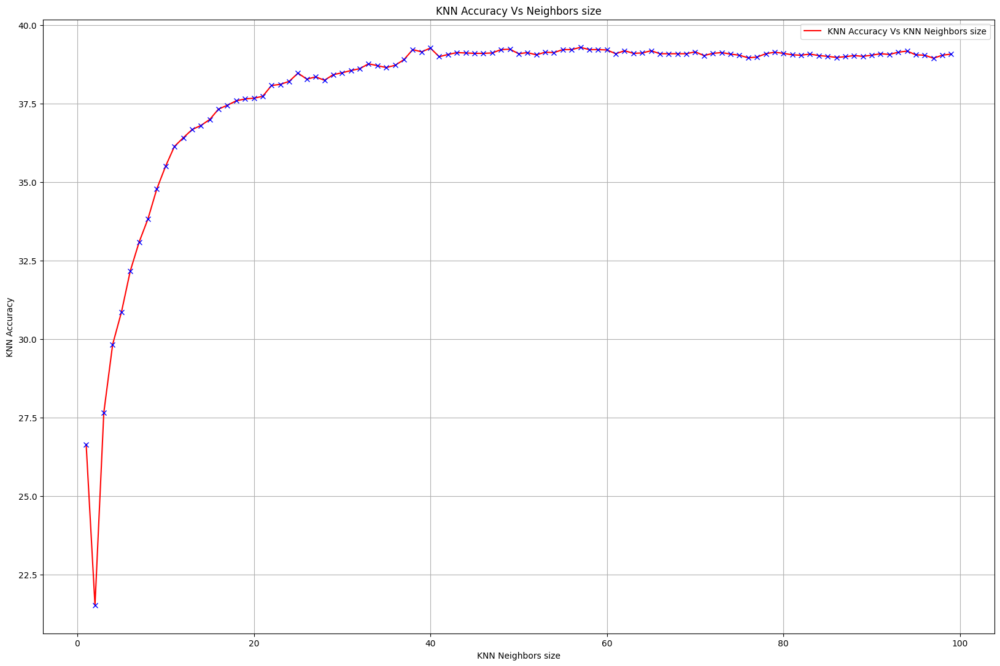

In [221]:
plt.figure(figsize=(20,13))
plt.plot(k_range, accuracy, 'r-', label='KNN Accuracy Vs KNN Neighbors size')
plt.plot(k_range, accuracy, 'bx')
plt.xlabel('KNN Neighbors size')
plt.ylabel('KNN Accuracy')
plt.legend()
plt.grid()
plt.title('KNN Accuracy Vs Neighbors size')
plt.show()

# Predicting

In [230]:
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Initialize the SVC model
svc_grid = SVC(gamma='auto')

# Initialize an empty list to store all predictions
all_predictions = []

# Iterate through all the possible features, limit to 10,000 predictions
num_predictions_needed = 10000
num_predictions_so_far = 0

for i in range(len(features_selection)):
    X_train, X_test, y_train, y_test = train_test_split(features_selection[i], encoded_labels, test_size=0.3, shuffle=False)
        
    # Train the SVC model
    svc_grid.fit(X_train, y_train)

    # Predict the result
    y_pred = svc_grid.predict(X_test)
    
    # Append predictions to the list, up to the needed amount
    num_predictions_this_iter = min(len(y_pred), num_predictions_needed - num_predictions_so_far)
    all_predictions.extend(y_pred[:num_predictions_this_iter])
    num_predictions_so_far += num_predictions_this_iter
    
    if num_predictions_so_far >= num_predictions_needed:
        break  # Stop iterating if we have enough predictions

# Create a DataFrame from the predictions list
df = pd.DataFrame({'target': all_predictions})

# Save DataFrame to a CSV file
file_path = "predictions.csv"
df.to_csv(file_path, index=False)

In [231]:
import pandas as pd

# Load the predictions CSV file into a DataFrame
file_path = "C:\\Users\\maxno\\Downloads\\predictions.csv"
df = pd.read_csv(file_path)

# Count the number of rows (predictions)
num_predictions = df.shape[0]

print("Number of predictions:", num_predictions)

Number of predictions: 10000
